# IMPORT LIBRARIES

In [339]:
# Các thư viện chuẩn của Python
import warnings

# Các thư viện bên ngoài
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.backends.backend_pdf import PdfPages
import seaborn as sns
import mne
from scipy import signal
from scipy.signal import spectrogram
from scipy.fft import fft, fftshift, fftfreq
from scipy.stats import skew, kurtosis
from scipy.signal import butter, lfilter, freqz, filtfilt
from scipy.io import loadmat
from sklearn.preprocessing import StandardScaler, MinMaxScaler, label_binarize
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (accuracy_score, precision_score, recall_score, f1_score, 
                             classification_report, confusion_matrix, roc_curve, auc)
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader 
from torch.utils.tensorboard import SummaryWriter

In [340]:
warnings.filterwarnings("ignore") # Ẩn các cảnh báo không cẩn thiết

# EDA & DATA STRUCTURE

In [341]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import pickle

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

file_names = []
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        file_names.append(os.path.join(dirname, filename))
        os.path.join(dirname, filename)
file_names = file_names[:34]
file_names = list(filter(lambda x: x != '/kaggle/input/eeg-data-for-mental-attention-state-detection/EEG Data/eeg_record28.mat', file_names))
file_names
# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

['/kaggle/input/eeg-data-for-mental-attention-state-detection/EEG Data/eeg_record25.mat',
 '/kaggle/input/eeg-data-for-mental-attention-state-detection/EEG Data/eeg_record26.mat',
 '/kaggle/input/eeg-data-for-mental-attention-state-detection/EEG Data/eeg_record17.mat',
 '/kaggle/input/eeg-data-for-mental-attention-state-detection/EEG Data/eeg_record1.mat',
 '/kaggle/input/eeg-data-for-mental-attention-state-detection/EEG Data/eeg_record3.mat',
 '/kaggle/input/eeg-data-for-mental-attention-state-detection/EEG Data/eeg_record22.mat',
 '/kaggle/input/eeg-data-for-mental-attention-state-detection/EEG Data/eeg_record20.mat',
 '/kaggle/input/eeg-data-for-mental-attention-state-detection/EEG Data/eeg_record15.mat',
 '/kaggle/input/eeg-data-for-mental-attention-state-detection/EEG Data/eeg_record13.mat',
 '/kaggle/input/eeg-data-for-mental-attention-state-detection/EEG Data/eeg_record14.mat',
 '/kaggle/input/eeg-data-for-mental-attention-state-detection/EEG Data/eeg_record10.mat',
 '/kaggle/in

### Bối cảnh của thí nghiệm:
Có 5 người tham gia các thí nghiệm, mỗi người tham gia 7 thì nghiệm vào khoảng thời gian từ 6pm trở đi và mỗi lần thử kéo dài từ 45 đến 55 phút. Người tham gia thí nghiệm sẽ được cho điều khiển một đoàn tàu giả lập trên một tuyến đường không có sự nổi bất gì trong khoảng thời gian từ 35 đến 55 phút. Cụ thể, trong 10 phút đầu tiên của mỗi thí nghiệm, người tham gia tập trung điều khiển tàu mô phỏng, chú ý kỹ đến các điều khiển của mô phỏng và theo dõi các diễn biến trên màn hình một cách chi tiết. Trong 10 phút tiếp theo của thí nghiệm, người tham gia ngừng theo dõi mô phỏng và trở nên mất tập trung. Họ không thực hiện bất kỳ đầu vào điều khiển nào trong thời gian đó và không chú ý đến các diễn biến trên màn hình máy tính; tuy nhiên, họ không được phép nhắm mắt hay buồn ngủ. Cuối cùng, trong 10 phút thứ ba của thí nghiệm, người tham gia được phép thư giãn tự do, nhắm mắt và ngủ gật nếu muốn.

### Thực hiện khám phá dữ liệu của người tham gia thứ 4, lần thử nghiệm thứ 4

In [342]:
# Đọc file eeg_record25.mat
mat = loadmat(file_names[0])

# Inspect the content of the .mat file
print(mat.keys())

dict_keys(['__header__', '__version__', '__globals__', 'o'])


**Trong từng file dữ liệu có định dạng .mat thì khi ta load dữ liệu ta sẽ có được data được lưu dưới dạng dictionary. Ta có các key trong dictionary là : header, version, globals, o**

In [343]:
print(mat['__header__'])

b'MATLAB 5.0 MAT-file, Platform: PCWIN, Created on: Sun Jan 25 20:54:48 2015'


**Header là key được dùng để lưu trữ dữ liệu mô tả của file đó. Ví dụ như trên ta có các thông tin có được từ header như phiên bản sử dụng MATLAB, nền tảng của hệ điều hành khi tạo file và ngày giờ khi file đó được tạo ra. Ví dụ với file eeg_record1.mat:**
- MATLAB version: MATLAB 5.0 
- Platform: PCWIN64
- Created on: Sun Jan 25 20:54:48 2015

In [344]:
print(mat['__version__'])

1.0


**Version là key được dùng để lưu trữ phiên bản của định dạng file .mat. Kết quả có thể là một chuối như '1.0' hoặc '2.0'. Với file eeg_record1.mat thì ta có được kết quả là 1.0 mang ý nghĩa đây là phiên bản định dạng 4.x hoặc thấp hơn và file chỉ có thể hỗ trợ về các ma trận cơ bản (không có struct, cell array, hay object).**

In [345]:
print(mat['__globals__'])

[]


**Globals là key dùng để lưu trữ các biến toàn cục của file .mat. Trong file eeg_record1.mat thì không tồn tại biến toàn cục nên ta có kết quả là rỗng**

In [346]:
o = mat['o']
o.dtype

dtype([('id', 'O'), ('tag', 'O'), ('nS', 'O'), ('sampFreq', 'O'), ('marker', 'O'), ('timestamp', 'O'), ('data', 'O'), ('trials', 'O')])

**Trường o là một structure array dùng để lưu trữ các thông tin về các thí nghiệm được lưu dưới các dạng dữ liệu khác nhau. Dưới đây là thông tin của các trường con (fields) trong o:**
|Trường trong o|Mô tả|
|:---|:---|
|id|ID nhận dạng của bản ghi dữ liệu EEG|
|tag|Thông tin nhãn hoặc metadata mô tả về bản ghi|
|nS|Số mẫu (number of samples), chỉ số lượng dữ liệu được ghi lại|
|sampFreq|Tần số lấy mẫu (sampling frequency) của dữ liệu EEG (đơn vị là Hz)|
|marker|Các sự kiện hoặc đánh dấu (markers) trong quá trình thu thập dữ liệu, dùng để đánh dấu thời điểm quan trọng|
|timestamp|Dấu thời gian (timestamp) của các điểm dữ liệu, dùng để đồng bộ hóa với các sự kiện khác|
|data|Dữ liệu chính, chứa tín hiệu EEG được thu thập từ các điện cực (kênh EEG). Đây là ma trận 2D với các mẫu và các kênh EEG|
|trials|Các phiên thử nghiệm, nếu có. Đây có thể là các lần thử nghiệm khác nhau được ghi nhận trong quá trình thu thập dữ liệu EEG|

In [347]:
sampFreq = o['sampFreq'][0][0][0][0]
print(f'Tần số lấy mẫu: {sampFreq} Hz')

Tần số lấy mẫu: 128 Hz


In [348]:
# In ra data ban đầu gồm các mảng trials
print(o['data'])

[[array([[108.,   0.,   0., ...,   0.,   0.,   0.],
         [109.,   0.,   0., ...,   0.,   0.,   0.],
         [110.,   0.,   0., ...,   0.,   0.,   0.],
         ...,
         [ 54.,   0.,   0., ...,   0.,   0.,   0.],
         [ 55.,   0.,   0., ...,   0.,   0.,   0.],
         [ 56.,   0.,   0., ...,   0.,   0.,   0.]])]]


In [349]:
# Trial đầu tiên của data
print(o['data'][0])

[array([[108.,   0.,   0., ...,   0.,   0.,   0.],
        [109.,   0.,   0., ...,   0.,   0.,   0.],
        [110.,   0.,   0., ...,   0.,   0.,   0.],
        ...,
        [ 54.,   0.,   0., ...,   0.,   0.,   0.],
        [ 55.,   0.,   0., ...,   0.,   0.,   0.],
        [ 56.,   0.,   0., ...,   0.,   0.,   0.]])]


In [350]:
# Các sample trong lần thử nghiệm đầu tiên
print(o['data'][0][0])

[[108.   0.   0. ...   0.   0.   0.]
 [109.   0.   0. ...   0.   0.   0.]
 [110.   0.   0. ...   0.   0.   0.]
 ...
 [ 54.   0.   0. ...   0.   0.   0.]
 [ 55.   0.   0. ...   0.   0.   0.]
 [ 56.   0.   0. ...   0.   0.   0.]]


In [351]:
# Sample đầu tiên của lần thử nghiệm đầu tiên
print(o['data'][0][0][0])

[ 108.            0.            0.         4446.15384615 3976.41025641
 5044.1025641  3829.74358974 4049.74358974 4344.1025641  4288.71794872
 4049.74358974 4216.41025641 4297.43589744 4151.28205128 4286.66666667
 4334.87179487 4204.61538462 1557.         1719.           40.848
    0.            0.            0.            0.            0.        ]


In [352]:
# Kích thước của lần trial đầu tiên
shape = np.shape(o['data'][0][0])
print(shape)

(415164, 25)


In [353]:
print(f'Thời gian thực hiện của lần trial đầu tiên: {round(shape[0]/sampFreq/60)} phút')

Thời gian thực hiện của lần trial đầu tiên: 54 phút


**Data của từng file sẽ lưu trữ trong đó n mảng với mỗi mảng là 1 lần trial. Trong 1 trial sẽ có một mảng lưu trữ m sample được thu thập. Ta có tần số thu thập dữ liệu là 128Hz, điều này có nghĩa là với 1 giây thực hiện thí nghiệm ta sẽ lấy 128 mẫu dữ liệu. Với mỗi lần thử nghiệm ta sẽ cho thực hiện các thí nghiệm với khoảng thời gian dao động từ 35 đến 55 phút.** 

**Ta có thể tạo một dataframe để lưu trữ thông tin của các lần thử nghiệm vào chung với nhau. Ở đây ta sẽ tạo ra một dataframe lưu trữ thông tin của file eeg_record25.mat**

In [354]:
columns = [
    'ED_COUNTER',    'ED_INTERPOLATED',    'ED_RAW_CQ',    'ED_AF3',    'ED_F7',
    'ED_F3',    'ED_FC5',    'ED_T7',    'ED_P7',    'ED_O1',
    'ED_O2',    'ED_P8',    'ED_T8',    'ED_FC6',    'ED_F4',
    'ED_F8',    'ED_AF4',    'ED_GYROX',    'ED_GYROY',    'ED_TIMESTAMP',
    'ED_ES_TIMESTAMP',    'ED_FUNC_ID',    'ED_FUNC_VALUE',    'ED_MARKER',    'ED_SYNC_SIGNAL'
]

#### Ta sẽ giải thích về nội dung của các cột có trong phần này:
- ED_COUNTER: 
- ED_INTERPOLATED: đây là một flag được sử dụng để đánh dấu là tại sample đó data có được nội suy hay không. Nghĩa là nếu dữ liệu của sample đó bị missing hoặc tín hiệu ở đó bị gián đoạn thì tại đây flag bằng 1. Điều này giúp ta có thể tránh được việc các tín hiệu nhận được là tín hiệu kém và đảm bảo được là tín hiệu truyền tới luôn mạch lạc khi gặp lỗi.
- ED_RAW_CQ: Contact Quality (CQ) của các điện cực, biểu thị mức độ tiếp xúc giữa các điện cực EEG và da đầu. Giá trị này thường nằm vào khoảng 0 đến 1 sau khi đã được chuẩn hóa. Giá trị càng thấp thì chứng tỏ là tín hiệu bị nhiễu và kém chất lượng.
- Các kênh tín hiệu EEG: 
|Channel|Vị trí|Chức năng liên quan|
|:--|:--|:--|
|ED_AF3|Frontal (trán trái)|Liên quan đến sự chú ý và nhận thức cảm xúc|
|ED_F7|Frontal (trán trái)|Chức năng ngôn ngữ, xử lý cảm xúc|
|ED_F3|Frontal (trán trái)|Lập kế hoạch, quyết định|
|ED_FC5|Frontocentral (giữa)|Giao tiếp giữa trán và trung tâm|
|ED_T7|Temporal (thái dương trái)|Nghe, ngôn ngữ|
|ED_P7|Parietal (đỉnh trái)|Cảm nhận không gian, nhận thức cơ thể|
|ED_O1|Occipital (chẩm trái)|Xử lý hình ảnh, thị giác|
|ED_O2|Occipital (chẩm phải)|Xử lý hình ảnh, thị giác|
|ED_P8|Parietal (đỉnh phải)|Xử lý cảm giác không gian, vận động|
|ED_T8|Temporal (thái dương phải)|Nghe, nhận thức âm thanh|
|ED_FC6|Frontocentral (giữa)|Giao tiếp trán và trung tâm, liên quan đến vận động|
|ED_F4|Frontal (trán phải)|Chức năng lập kế hoạch, ra quyết định|
|ED_F8|Frontal (trán phải)|Xử lý cảm xúc, khả năng đồng cảm|
|ED_AF4|Frontal (trán phải)|Tập trung, chú ý|
- ED_GYROX và ED_GYROY: Tín hiệu từ cảm biến con quay hồi chuyển, đo chuyển động xoay quanh các trục. Hai tín hiệu này cho ta thông tin về việc chuyển động của đầu làm nhiễu cơ học trong EEG.Trong đó: 
    - ED_GYROX: Dữ liệu chuyển động trên trục X (ngang).
    - ED_GYROY: Dữ liệu chuyển động trên trục Y (dọc).
- ED_TIMESTAMP: Dấu thời gian (timestamp) cho mỗi mẫu tín hiệu, tính bằng mili-giây. Thường dùng để xác định mốc thời gian các sự kiện xảy ra trong thí nghiệm.
- ED_ES_TIMESTAMP: Dấu thời gian cho mỗi sự kiện của hệ thống (event-related timestamp). Thường dùng để xác định các mốc thời gian của các sự kiện hệ thống như bắt đầu hay chấm dứt tác vụ.
- ED_FUNC_ID và ED_FUNC_VALUE: Thường được dùng để theo dõi các trạng thái cảm xúc (kích thích, tập trung). Trong đó:
    - ED_FUNC_ID: Mã định danh cho các trạng thái chức năng như nhận thức, tập trung, ...
    - ED_FUNC_VALUE: Giá trị đo cường độ hoặc mức độ trạng thái đó.
- ED_MARKER: Là các dấu hiệu hoặc mốc thời gian được gắn vào dữ liệu để đánh dấu các sự kiện quan trọng trong quá trình thu thập.
- ED_SYNC_SIGNAL: Tín hiệu đồng bộ hóa để liên kết dữ liệu EEG với thiết bị bên ngoài (ví dụ: máy ghi video)

In [355]:
data = []
for i in range (np.shape(o['data'])[0] ): # Lặp qua các lần thử nghiệm
    for j in range(np.shape(o['data'][i])[0]): # Lặp qua các sample trong tất cả lần thử nghiệm
        data.append(o['data'][i][j])
data = data[0]
print(data)

[[108.   0.   0. ...   0.   0.   0.]
 [109.   0.   0. ...   0.   0.   0.]
 [110.   0.   0. ...   0.   0.   0.]
 ...
 [ 54.   0.   0. ...   0.   0.   0.]
 [ 55.   0.   0. ...   0.   0.   0.]
 [ 56.   0.   0. ...   0.   0.   0.]]


In [356]:
eeg_df = pd.DataFrame(data, columns=columns)
eeg_df.reset_index(inplace=True)
eeg_df.rename(columns={'index': 'timestamp'}, inplace=True)

In [357]:
def get_state(timestamp):
    if timestamp <= 10*128*60:
        return 'focused'
    elif timestamp > 20*128*60:
        return 'drownsy'
    else:
        return 'unfocused'

eeg_df['state'] = eeg_df['timestamp'].apply(get_state)

In [358]:
eeg_df

,timestamp,ED_COUNTER,ED_INTERPOLATED,ED_RAW_CQ,ED_AF3,ED_F7,ED_F3,ED_FC5,ED_T7,ED_P7,...,ED_AF4,ED_GYROX,ED_GYROY,ED_TIMESTAMP,ED_ES_TIMESTAMP,ED_FUNC_ID,ED_FUNC_VALUE,ED_MARKER,ED_SYNC_SIGNAL,state
0,0,108.0,0.0,0.0,4446.153846,3976.410256,5044.102564,3829.743590,4049.743590,4344.102564,...,4204.615385,1557.0,1719.0,40.848,0.000000,0.0,0.0,0.0,0.0,focused
1,1,109.0,0.0,0.0,4446.153846,3973.846154,5044.615385,3826.666667,4048.205128,4345.128205,...,4203.589744,1557.0,1719.0,40.848,0.000000,0.0,0.0,0.0,0.0,focused
2,2,110.0,0.0,0.0,4442.564103,3973.846154,5043.076923,3825.128205,4046.666667,4348.717949,...,4202.051282,1557.0,1720.0,40.848,0.000000,0.0,0.0,0.0,0.0,focused
3,3,111.0,0.0,464.0,4440.000000,3976.410256,5044.615385,3829.230769,4046.153846,4347.179487,...,4208.205128,1556.0,1718.0,40.848,0.000000,0.0,0.0,0.0,0.0,focused
4,4,112.0,0.0,0.0,4439.487179,3977.948718,5045.128205,3840.000000,4048.205128,4344.102564,...,4208.205128,1554.0,1718.0,41.418,0.125108,0.0,0.0,0.0,0.0,focused
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
415159,415159,52.0,0.0,0.0,4422.564103,3787.179487,4722.564103,3806.153846,4035.384615,4174.358974,...,4047.692308,1565.0,1729.0,3287.326,3246.328857,0.0,0.0,0.0,0.0,drownsy
415160,415160,53.0,0.0,0.0,4422.051282,3788.717949,4711.794872,3815.384615,4036.410256,4148.717949,...,4049.743590,1564.0,1731.0,3287.334,3246.328857,0.0,0.0,0.0,0.0,drownsy
415161,415161,54.0,0.0,0.0,4403.076923,3795.384615,4720.512821,3793.333333,4005.128205,4203.589744,...,4056.410256,1563.0,1731.0,3287.342,3246.328857,0.0,0.0,0.0,0.0,drownsy
415162,415162,55.0,0.0,0.0,4406.153846,3801.538462,4735.897436,3781.538462,4000.512821,4265.641026,...,4057.435897,1564.0,1731.0,3287.350,3246.328857,0.0,0.0,0.0,0.0,drownsy


In [359]:
ed_counter = eeg_df['ED_COUNTER']
# Phát hiện các giá trị bị mất
missing_packets = [ed_counter[i] + 1 for i in range(len(ed_counter) - 1) if ed_counter[i+1] - ed_counter[i] > 1]

print("Gói tín hiệu bị mất:", missing_packets)

# Bởi vì bộ đếm của ta đạt giá trị cao nhất tại 128 nên khi đạt đến điểm này thì nó sẽ quay về 0
# Cho nên là nếu bộ đếm đang ở 128 nên khi reset lại về 0 thì chênh lệch giữa hai điểm này là số âm nên vẫn có thể được hiểu là nó vẫn đang liên tiếp tăng dần
print((eeg_df['ED_INTERPOLATED'] == 1).any())

Gói tín hiệu bị mất: []
False


***Qua đây ta thấy là trong bộ dữ liệu không tồn tại gói tin bị mất cho nên ko có giá trị nội suy trong bộ dữ liệu trong file eeg_record25.mat***

In [360]:
ed_raw_cq = eeg_df['ED_RAW_CQ']
print(f'Raw Contact Quality Max and Min: {ed_raw_cq.max()}, {ed_raw_cq.min()}')

Raw Contact Quality Max and Min: 510.0, 0.0


***Bởi vì giá trị của Raw Contact Quality người ta thường chuẩn hóa về từ 0 đến 1 để dễ dàng hơn trong việc so sánh với chất lượng tiếp xúc giữa các kênh EEG hoặc giữa các bản ghi EEG từ các đối tượng hoặc điều kiện khác nhau và để các mô hình máy học cho ra kết quả tốt hơn. Cho nên tại đây các giá trị này chưa được chuẩn hóa về từ 0 đến 1 nên ta cần thực hiện chuẩn hóa dữ liệu.***

## Visualization

Tín hiệu điện não (EEG) cung cấp thông tin về các hoạt động theo nhịp *(rhythmic activities)* trên các dải tần số khác nhau. \
Các dải tần phổ biến bao gồm:
- Delta: 0.5–4 Hz, thường liên quan đến giấc ngủ sâu và trạng thái nghỉ ngơi.
- Theta: 4–8 Hz, liên quan đến trạng thái thư giãn hoặc thiền định.
- Alpha: 8–13 Hz, xuất hiện trong trạng thái tỉnh táo nhưng thư giãn.
- Beta: 13–30 Hz, liên quan đến sự tập trung và hoạt động nhận thức.
- Gamma: 30–50 Hz, gắn liền với xử lý thông tin phức tạp và hoạt động nhận thức cao cấp.

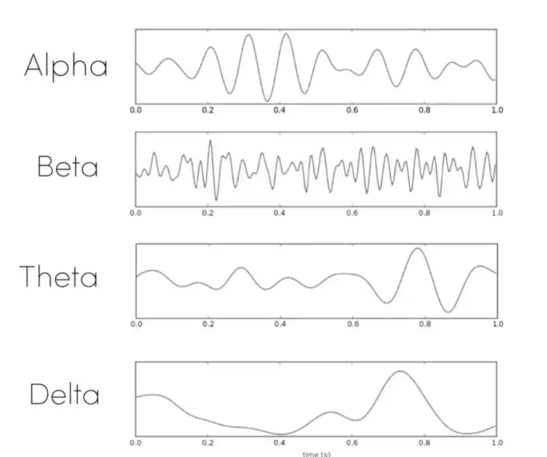
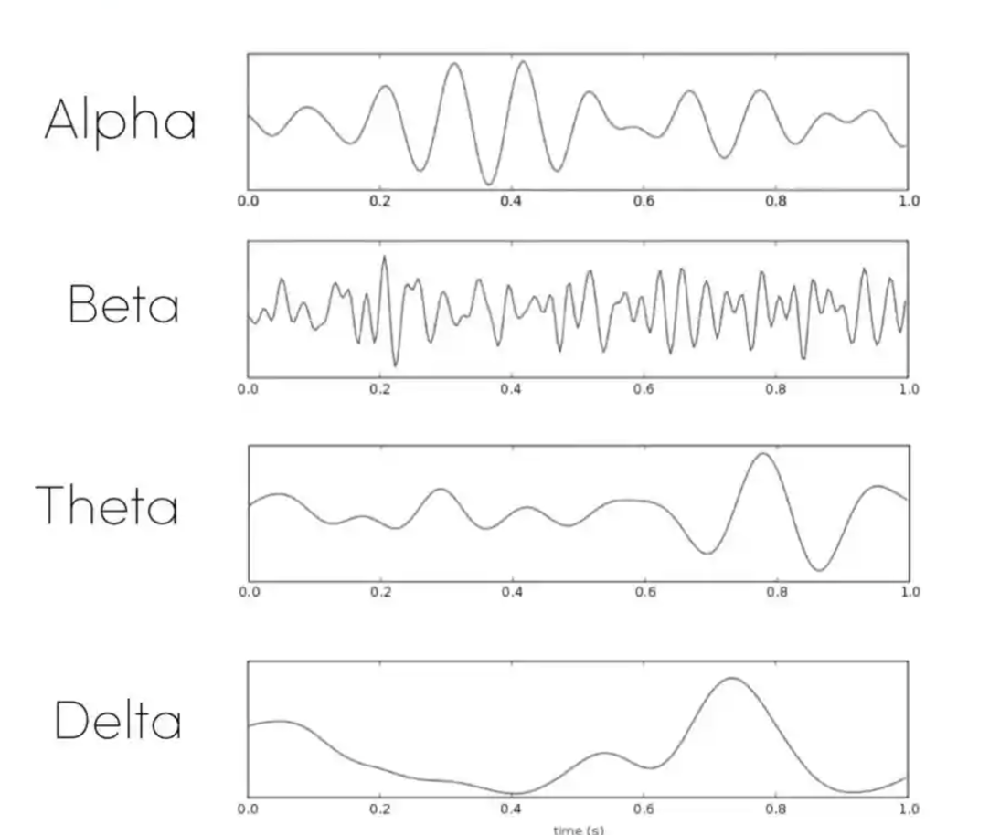

Creating RawArray with float64 data, n_channels=14, n_times=10000
    Range : 0 ... 9999 =      0.000 ...    78.117 secs
Ready.
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 16.000 (s)
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 16.000 (s)
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 16.000 (s)
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 16.000 (s)
Plotting power spectral density (dB

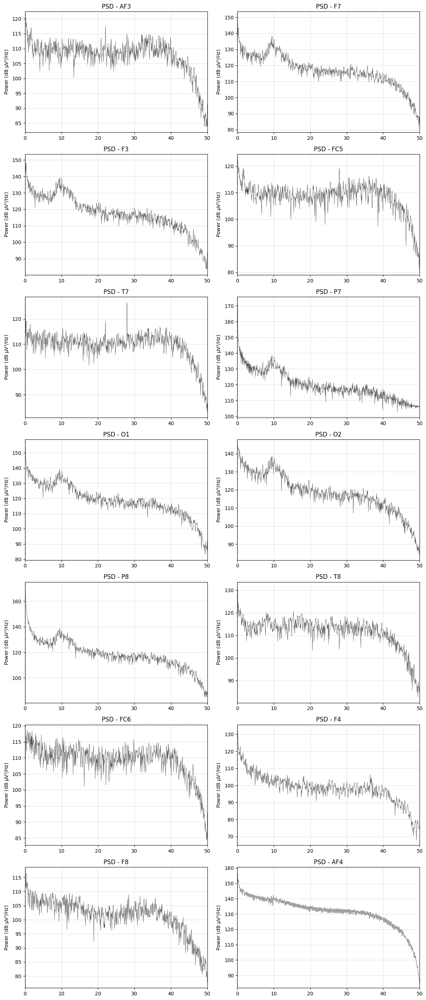

In [361]:
# Lấy dữ liệu EEG và tần số lấy mẫu
data = o['data'][0][0]  # Dữ liệu EEG
FS = o['sampFreq'][0][0][0][0]  # Tần số lấy mẫu
channels = ['AF3', 'F7', 'F3', 'FC5', 'T7', 'P7', 'O1', 'O2', 'P8', 'T8', 'FC6', 'F4', 'F8', 'AF4']

# Xử lý dữ liệu EEG: cắt dữ liệu từ 5000 đến 15000 mẫu cho tất cả các kênh
data_ave = data[5000:15000, :] - np.mean(data[5000:15000, :], axis=0)

# Lấy dữ liệu của các kênh cần thiết từ data_ave (14 kênh đầu tiên trong trường hợp có 25 kênh)
data_ave_14_channels = data_ave[:, 3:17]  # Lấy 14 kênh đầu tiên

# Chuyển dữ liệu thành dạng 2D (số kênh, 10000 mẫu)
data_ave_2d = data_ave_14_channels.T  # Chuyển dữ liệu thành (số kênh, 10000 mẫu)

# Tạo đối tượng Raw với tất cả các kênh
info = mne.create_info(channels, sfreq=FS, ch_types='eeg')
raw_data = mne.io.RawArray(data_ave_2d, info)  # Chuyển đổi dữ liệu thành đối tượng Raw

# Số lượng hàng (mỗi hàng 2 kênh)
n_rows = len(channels) // 2
fig, axes = plt.subplots(n_rows, 2, figsize=(12, n_rows * 4))

# Vẽ PSD cho từng kênh và sắp xếp 2 kênh trên mỗi hàng
for i, channel in enumerate(channels):
    row = i // 2
    col = i % 2
    raw_data.plot_psd(fmax=50, picks=[i], ax=axes[row, col], show=False)
    axes[row, col].set_title(f'PSD - {channel}')

# Đảm bảo các biểu đồ không bị chồng lấn
plt.tight_layout()
plt.show()

### Mật độ phổ công suất (Power Spectral Density - PSD) của dữ liệu EEG:
- Nhìn tổng quát các biểu đồ phổ công suất thì ta thấy rằng xu hướng năng lượng của các tín hiệu đều giảm dần khi tần số tăng lên. Đa phần các tín hiệu từ tất cả điện cực đều có năng lượng khá lớn vào khoảng bắt đầu (0 HZ).
- Với cá biến động năng lượng của các kênh tín hiệu ta có thể nhận xét về trạng thái của não bộ. Ví dụ như với các kênh tín hiệu như F7, F3, P7, O1, O2, P8 ta thấy là với tần số thấp (10 HZ) biên độ năng lượng bổng dưng lại tăng mạnh. Điều này cho thấy với khoảng tần số 10 HZ thì sóng alpha vào trạng thái hoạt động. Đây là dấu hiệu cho thấy người tham gia thí nghiệm đã chuyển từ trạng thái thư giản sang trạng thái tập trung.
- Với các kênh tín hiệu thì sau khi não bộ chuyển sang trạng thái tập trung thì lúc này biên độ của năng lượng đã bắt đầu ổn định lại và giảm bớt tốc độ giảm năng lượng. Điều này có nghĩa là trong khoảng thời gian này não bộ đang trong trạng thái tập trung xử lý các thông tin được não bộ tiếp thu.
- Ta có thể thấy các kênh tín hiệu có trạng thái biến động năng lượng liên tục vào đoạn tần số 35Hz đến 50 HZ cho thấy là não bộ đã bắt đầu chuyển sang trạng thái căng thẳng nhẹ vì năng lượng tại đây vẫn còn nhỏ.

Not setting metadata
40 matching events found
Applying baseline correction (mode: mean)
0 projection items activated


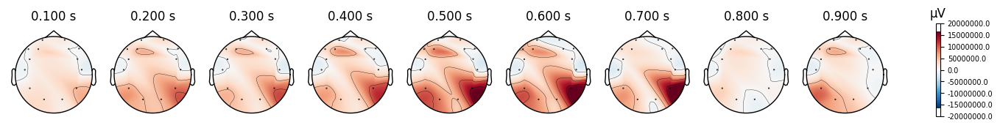

In [362]:
# Tạo sự kiện giả định
n_samples = raw_data.n_times
event_interval = int(FS * 2)  # 2 giây
events = np.array([[i, 0, 1] for i in range(0, n_samples, event_interval)])

# Thêm layout mặc định
montage = mne.channels.make_standard_montage('standard_1005')  # Layout chuẩn 10-20
raw_data.set_montage(montage)

# Tạo Epochs từ RawArray
epochs = mne.Epochs(raw_data, events, event_id=1, tmin=0, tmax=2, baseline=(0, 0), detrend=1)

# Tính trung bình để tạo Evoked
evoked = epochs.average()

# Vẽ topographic maps
times = np.arange(0.1, 1.0, 0.1)  # Các thời điểm (giây)
fig = evoked.plot_topomap(times=times, ch_type='eeg')
fig.show()

### Biểu đồ topo điện thế
- Topo điện thế hiển thị giá trị điện thế EEG tại mỗi kênh trên da đầu. Chúng tương tự như bản đồ nhiệt, trong đó các dải điện thế khác nhau được biểu diễn bằng các màu sắc khác nhau.
- Do vì topo map được biểu diễn bằng nhiều màu sắc khác nhau trên cùng 1 biểu đồ cho nên ta có thể kiểm tra đồng thời các phân bố của các giá trị điện thế trên da đầu. Điều này có một lợi ích đó là ta có thể phân tích cùng lúc với tất cả điện cực chung với nhau chứ không phải mỗi điện cực đơn lẻ.
- Với biểu đồ trên, ta có tần số lấy mẫu là 128HZ một giây, ta cho phát sinh các sự kiện giả định mỗi hai giây để quan sát hoạt động điện thế của các kênh tín hiệu. Ta có các màu sắc được biểu thị trên đồ thị với màu đỏ đại diện các vùng có điện thế dương cao (tín hiệu mạnh), màu xanh đại hiện các vùng có điện thế âm thấp hơn (tín hiệu yếu). Các chấm đen trên đồ thị đại diện cho các điện cực trên đầu.
- Trong khoảng thời gian bắt đầu thì các điện cực bắt đầu phát ra điện thế phân bố tùy vào các nơi trên đầu và trong khoảng thời gian từ lúc bắt đầu đến 0.4s thì điện thế có dấu hiệu tập trung ở phía bán cầu não trái đặc biệt là ở các điện cực T8 và P8. Điều này có thể nhận thấy trong khoảng thời gian từ 0.4s đến 0.7s thì các điện cực xử lý nhận thức bắt đầu hoạt động nhiều hơn với các sự kiện được tạo ra và khi sự kiện kết thúc thì các điện cực t về trạng thái ổn định như ban đầu. 

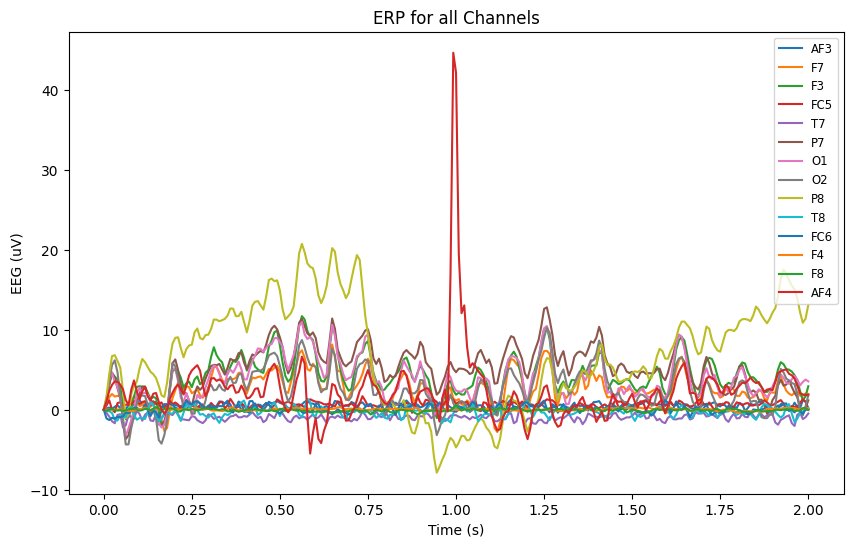

In [363]:
times = evoked.times  # Thời gian của mỗi điểm
data = evoked.data  # Dữ liệu EEG

# Vẽ tất cả các kênh EEG
plt.figure(figsize=(10, 6))
for i in range(len(evoked.info['ch_names'])):
    plt.plot(times, data[i], label=evoked.info['ch_names'][i])

plt.xlabel('Time (s)')
plt.ylabel('EEG (uV)')
plt.title('ERP for all Channels')
plt.legend(loc='upper right', fontsize='small')
plt.show()

Biểu đồ ERP (Event-Related Potentials) là biểu đồ dạng lấy trung bình dữ liệu qua nhiều lần lặp lại epoch, tập trung vào các phản ứng trung bình của epoch. Biểu đồ này sẽ cho thấy mức hoạt động 'thấp' sẽ xảy ra trên baseline trước khi xảy ra một sự kiện nào đó trên timeline. 

Hình trên là một đồ thị ERP với các điện cực được chồng lên nhau có thể cho ta biết được về các sự kiện quen thuộc đã xảy ra trên khoảng thời gian đó. Với các mức biến động dữ liệu trung bình tại các thời điểm khác nhau của từng điện cực cho ta thấy được độ ảnh hưởng của sự kiện đó đến tín hiệu điện cực. 

Như hình trên ta thấy tại thời điểm 1.0 giây thì biến động dữ liệu trung bình đạt cực đại trên kênh AF4, chứng tỏ có một sự kiện xảy ra trong khoảng thời gian đó có ảnh hưởng lớn đến tín hiệu trên kênh này.



### Dạng tín hiệu trong 14 kênh của người thứ 4 vào ngày thí nghiệm thứ 4

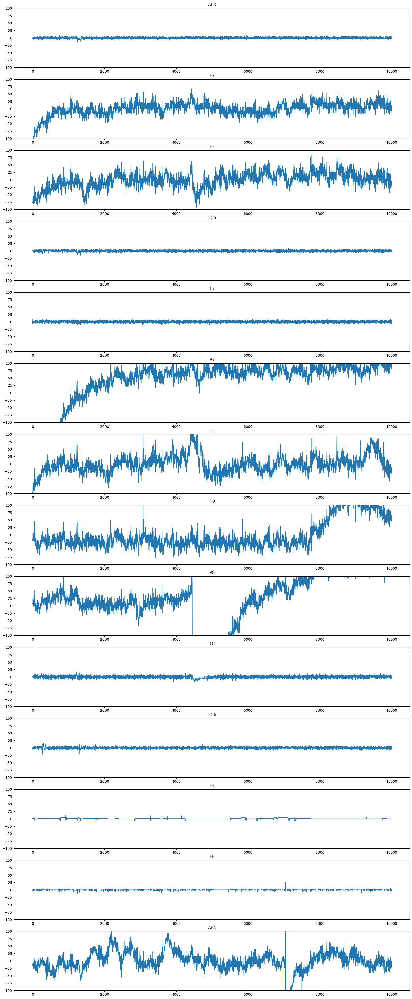

In [364]:
fig, ax = plt.subplots(14,1)
fig.set_figwidth(20)
fig.set_figheight(50)
data = o['data'][0][0]
FS = o['sampFreq'][0][0][0][0]
channels = ['AF3', 'F7', 'F3', 'FC5', 'T7', 'P7', 'O1', 'O2', 'P8', 'T8', 'FC6', 'F4', 'F8', 'AF4']
for i in range(14):
    data_ave = data[5000:15000,i+3]-np.mean(data[5000:15000,i+3]) 
    ax[i].plot(data_ave)
    ax[i].set_title(channels[i])
    ax[i].set_ylim(-100,100)

### Chức năng cụ thể của các bộ phận não: 
+ Trung não thuộc phần thân não: Có nhiệm vụ điều khiển các cử động mắt. 

+ Cầu não: Phối hợp các cử động mắt, những biểu cảm của khuôn mặt, khả năng nghe và khả năng giữ thăng bằnranh. 

+ Vùng hạ đồi: Kiểm soát cảm xúc, ăn, ngủ, điều hòa thân nhiệt, tình dục, vận , ...ng,…

+ Thùy trán là cơ quan kiểm soát lời nói, hành vi, trí tuệ và các kỹ năng vận động. 

+ Thùy chẩm: Có vai trò giúp con người cảm nhận được màu sắc và hình dạng. 

+ Thùy đỉnh: Có nhiệm vụ phân tích cùng lúc các tín hiệu từ nhiều vùng khác nhau của não để đưa ra những cảm nhận của sự vật. 

+ Thùy thái dương: Nhờ có bộ phận này của não mà chúng ta có thể nhớ được ngôn ngữ, nhận biết được khuôn mặt, sự vật xung quanh và phân tích được những pcon hảườià phát triển.

  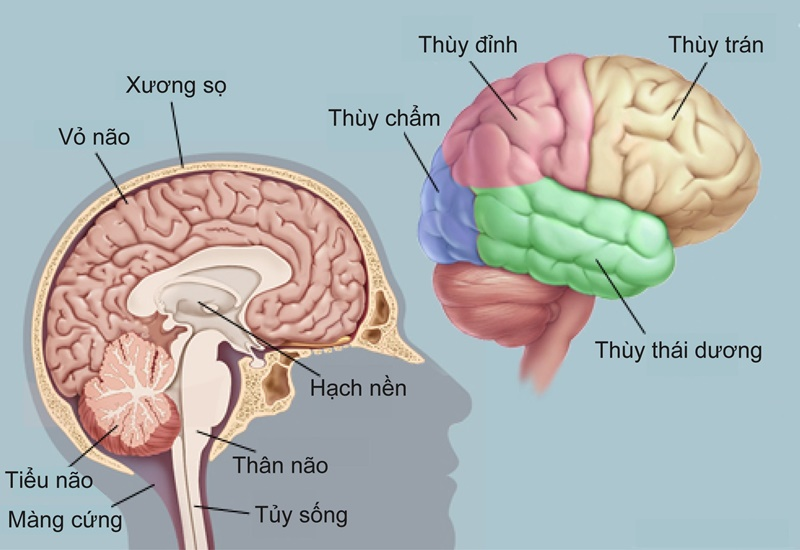

### Thông tin của các kênh tín hiệu sóng não
- F7 và F3 là hai kênh nằm ở bán cầu trái của não và nằm ở thùy trước trán. Hai kênh này phụ trách việc xử lý các công việc như lời nói, hành vi, trí tuệ, ngôn ngữ và các kỹ năng vận động. F7 và F3 hợp tác với nhau trong các nhiệm vụ như giao tiếp, giúp hiểu ý nghĩa của cảm xúc trong lời nói. Điều này cho thấy F3 đóng vai trò quan trọng trong kiểm soát các hành vi logic trong khi F7 bổ sung các thông tin về cảm xúc => Có thể đưa ra các quyết định giữa lý trí và cảm xúc.
  
- P7 và P8 là hai kênh nằm ở thùy đỉnh phân biệt lần lượt ở thùy đỉnh bên trái và thùy đỉnh bên phải. Những vùng não khác xử lý thông tin cảm giác mà chúng chịu trách nhiệm, rồi chuyển tiếp những gì chúng xử lý đến thùy đỉnh. Sau khi tiếp nhận các thông tin đó, thùy đỉnh tích hợp nó thành một dạng có thể hiểu được và gửi thông tin đến những vùng não khác để có thể phản ứng hoặc không phản ứng với những gì cảm nhận được. Hai điện cực P7 và P8 liên quan đến nhận thức và xử lý thông tin không gian, phụ trách vai trò quan trọng trong xử lý các tín hiệu thị giác và các kích thích cảm giác phức tạp => Nhận thức rõ ràng về vị trí các sự vật trong không gian và cảm nhận về sự vật đó.
  
- O1 và O2 là hai kênh nằm ở thùy chẩm phân biệt lần lượt ở hai bên trái thùy chẩm và bên phải thùy chẩm và nằm gần đường trung tâm sọ. Hai điện cực này chịu trách nhiệm chính là thị giác cụ thể là nhận thức về thế giới thị giác của con người, bao gồm màu sắc, hình dạng và chuyển động. Chúng nhận thông tin từ các vùng khác và xử lý thông tin thị giác nhận được và truyền các thông tin hình ảnh về thùy thái dương để hiểu ý nghĩa của hình ảnh, lưu trữ ký ức và phản ứng với các kích thích bên ngoài.
  
- AF4 là kênh nằm ở phần trán trước bên phải của đầu đối xứng với AF3. AF4 đo lường hoạt động ở khu vực chịu trách nhiệm về tư duy, lập kế hoạch, và ra quyết định.

### Vị trí các kênh tín hiệu
![Vị trí các kênh tín hiệu](https://tusach.thuvienkhoahoc.com/images/c/c7/1302.gif)

Source: https://hahoangkiem.com/can-lam-sang/dien-nao-do-co-ban-1474.html

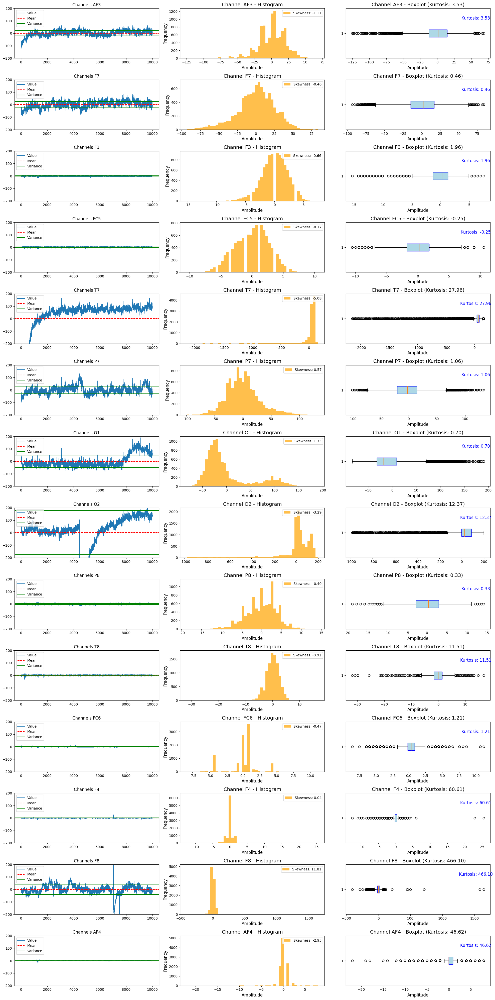

In [365]:
data = o['data'][0][0]
use_channels = [4,5,6,7,8,9,10,11,12,13,14,15,16,17]
use_channels_names= ['AF3', 'F7', 'F3', 'FC5', 'T7', 'P7', 'O1', 'O2', 'P8', 'T8', 'FC6', 'F4', 'F8', 'AF4']
# Tạo figure với 2 biểu đồ cho mỗi kênh
fig, ax = plt.subplots(len(use_channels), 3, figsize=(18, 40))  # 3 cột: Signal, Histogram, Boxplot

# Điều chỉnh khoảng cách giữa các hàng và cột
#plt.subplots_adjust(hspace=0.5, wspace=0.3)
fig.set_size_inches(20,40)
j=0
#for i in useful_channels:
for j, (i, name) in enumerate(zip(use_channels, use_channels_names)):
    data_ave = data[5000:15000,i]-np.mean(data[5000:15000,i])
    #print(data)
    # Tính toán các giá trị mean và variance
    mean_value = np.mean(data_ave)
    variance_value = np.var(data_ave)
    std_value = np.sqrt(variance_value)

    # Tính toán Skewness và Kurtosis
    skewness = skew(data_ave)
    kurt = kurtosis(data_ave)
    
    ax[j,0].plot(data_ave)

    # Add horizontal lines for mean and variance
    ax[j,0].axhline(mean_value, color='red', linestyle='--', label=f'Mean: {mean_value:.2f}')
    ax[j,0].axhline(mean_value + np.sqrt(variance_value), color='green', linestyle='-', label=f'Mean + Std: {mean_value + np.sqrt(variance_value):.2f}')
    ax[j,0].axhline(mean_value - np.sqrt(variance_value), color='green', linestyle='-', label=f'Mean - Std: {mean_value - np.sqrt(variance_value):.2f}')
    
    ax[j,0].set_ylim(-200,200)
    ax[j,0].set_title(f'Channels {name}')

    # Add legend
    ax[j,0].legend(loc='upper left', labels=['Value','Mean', 'Variance'])

    # Biểu đồ tần suất (Histogram)
    ax[j, 1].hist(data_ave, bins=50, color='orange', alpha=0.7, label=f'Skewness: {skewness:.2f}')
    ax[j, 1].set_title(f'Channel {name} - Histogram', fontsize=14)
    ax[j, 1].set_xlabel('Amplitude', fontsize=12)
    ax[j, 1].set_ylabel('Frequency', fontsize=12)
    ax[j, 1].legend(loc='upper right')
    
    # Biểu đồ hộp (Boxplot)
    ax[j, 2].boxplot(data_ave, vert=False, patch_artist=True, 
                         boxprops=dict(facecolor='lightblue', color='blue'))
    ax[j, 2].set_title(f'Channel {name} - Boxplot (Kurtosis: {kurt:.2f})', fontsize=14)
    ax[j, 2].set_xlabel('Amplitude', fontsize=12)
    ax[j, 2].text(0.9, 0.8, f'Kurtosis: {kurt:.2f}', transform=ax[j, 2].transAxes, 
                      fontsize=12, color='blue', ha='center', va='center')
    
    j=j+1
plt.tight_layout()
plt.show()

### **Phân tích tín hiệu có được từ một lần thử nghiệm**

**Các điểm tín hiệu bất thường trong đồ thị:**
- AF3 và F7: hai điện cực này có biên độ dao động rất ổn định trong suốt quá trình lấy sample. Tuy rằng cả hai đều có một số lần dữ liệu bị giảm nhẹ nhưng bởi vì hai điện cực này ở vùng trước trán cho nên là nó rất dễ bị ảnh hưởng của chuyển động cơ mặt hay chuyển động mắt không cân xứng. 

- T7: Ta có thể thấy ban đầu biên độ tín hiệu của điện cực này khá thấp. Điều này có thể suy đoán là với lúc bắt đầu thử nghiệm thì gel dẫn điện hoặc các chất làm ẩm chưa thấm hoàn toàn qua da nên tín hiệu ban đầu có thể thấp và sau một thời gian thì biên độ tín hiệu sẽ tăng dần trở lại. Tuy nhiên thì về sau tín hiệu tăng rất nhanh và có thể là do T7 là nơi phụ trách các thao tác nhận thức và xử lý các tín hiệu thị giác và vì người tham gia thí nghiệm cần tương tác với máy nên hoạt động của vùng này sẽ mạnh.

- P7: Biên độ dao động của điện cực này không được ổn định trong suốt quá trình lấy sample. Nguyên nhân có thể là do ảnh hưởng thị giác bởi thí nghiệm đang làm. Có thể là trong quá trình thực hiện thí nghiệm thì người này có các chuyển động mắt hay bị nhiễu cơ làm biên độ tăng khác thường trong khoảng thời gian ngắn.

- O1 : Thu thấp được 8000 sample thì biên độ dao động tăng mạnh vượt qua phương sai. Đó có thể là do một số lỗi kỹ thuật như điện cực không được gắn chắc chắn hoặc các vấn đề trong thí nghiệm như trên màn hình thí nghiệm xuất hiện các hình ảnh khác thường như màu sắc thay đổi đột ngột thì có thế làm biên độ tăng mạnh.
  
- O2: Có thể là trong quá trình thực hiện thí nghiệm, điện cực tại vị trí này gặp phải vấn kề kỹ thuật như điện cực bị bung ra nên ta thấy khi đồ thị chạy đến 4000 sample thì bổng dưng biên độ bị tụt mạnh và tăng dần trở lại nhưng nó vẫn không được ổn định cho đến khi kết thúc.

- F8: Có một đoạn biên độ dao động bỗng dưng giảm rồi lại tăng mạnh và về trạng thái bình thường thì xuất phát từ các nguyên nhân khác nhau. Một, điện cực này có thể gặp vấn đề lúc được cài đặt dẫn đến một chút sự cố trong quá trình lấy sample. Hai, cảm xúc của người tham gia có thể không ổn định nên có thể gây ảnh hưởng đến biên độ dao động trong khoảng thời gian này.

# DATA PREPROCESSING

In [366]:
# Hàm lấy số thứ tự của record
def extract_number(file_name):
    return int(file_name.split('eeg_record')[1].split('.mat')[0])
#Sắp xếp lại cả 2 địa chỉ và tên record theo số thứ tự được lấy
file_names = sorted(file_names, key=extract_number)
filenames = sorted(filenames, key=extract_number)

In [367]:
#In ra địa chỉ record
file_names

['/kaggle/input/eeg-data-for-mental-attention-state-detection/EEG Data/eeg_record1.mat',
 '/kaggle/input/eeg-data-for-mental-attention-state-detection/EEG Data/eeg_record2.mat',
 '/kaggle/input/eeg-data-for-mental-attention-state-detection/EEG Data/eeg_record3.mat',
 '/kaggle/input/eeg-data-for-mental-attention-state-detection/EEG Data/eeg_record4.mat',
 '/kaggle/input/eeg-data-for-mental-attention-state-detection/EEG Data/eeg_record5.mat',
 '/kaggle/input/eeg-data-for-mental-attention-state-detection/EEG Data/eeg_record6.mat',
 '/kaggle/input/eeg-data-for-mental-attention-state-detection/EEG Data/eeg_record7.mat',
 '/kaggle/input/eeg-data-for-mental-attention-state-detection/EEG Data/eeg_record8.mat',
 '/kaggle/input/eeg-data-for-mental-attention-state-detection/EEG Data/eeg_record9.mat',
 '/kaggle/input/eeg-data-for-mental-attention-state-detection/EEG Data/eeg_record10.mat',
 '/kaggle/input/eeg-data-for-mental-attention-state-detection/EEG Data/eeg_record11.mat',
 '/kaggle/input/eeg

In [368]:
#In ra tên record
filenames

['eeg_record1.mat',
 'eeg_record2.mat',
 'eeg_record3.mat',
 'eeg_record4.mat',
 'eeg_record5.mat',
 'eeg_record6.mat',
 'eeg_record7.mat',
 'eeg_record8.mat',
 'eeg_record9.mat',
 'eeg_record10.mat',
 'eeg_record11.mat',
 'eeg_record12.mat',
 'eeg_record13.mat',
 'eeg_record14.mat',
 'eeg_record15.mat',
 'eeg_record16.mat',
 'eeg_record17.mat',
 'eeg_record18.mat',
 'eeg_record19.mat',
 'eeg_record20.mat',
 'eeg_record21.mat',
 'eeg_record22.mat',
 'eeg_record23.mat',
 'eeg_record24.mat',
 'eeg_record25.mat',
 'eeg_record26.mat',
 'eeg_record27.mat',
 'eeg_record28.mat',
 'eeg_record29.mat',
 'eeg_record30.mat',
 'eeg_record31.mat',
 'eeg_record32.mat',
 'eeg_record33.mat',
 'eeg_record34.mat']

In [369]:
#Chạy record đầu tiên có thứ tự 1
mat = loadmat(file_names[0])

# Kiểm tra các keys có trong tệp .mat:
print(mat.keys())

dict_keys(['__header__', '__version__', '__globals__', 'o'])


In [370]:
#Tính phương sai để đánh giá sự nhiễu tín hiệu
var = []
for i in range (14):
    var.append(np.var(data[:, i+3]))
var

[15.966228739232278,
 8913.706918089418,
 4512.401216678701,
 41.70650928242857,
 12.31233864851336,
 12692.826283505941,
 2061.4169489545698,
 1351.5937811696417,
 5636.198190732953,
 6.383788756020905,
 8.1801188277253,
 96.97662483967483,
 58.90527151630925,
 4498.308866573982]

* **Giá trị phương sai rất lớn như 8913.71, 4512.40, 12692.83, và 5636.20 cho thấy rằng các tín hiệu này có sự phân tán mạnh. Điều này có thể chỉ ra rằng tín hiệu chứa nhiều nhiễu hoặc biến đổi lớn trong dữ liệu.**

* **Các giá trị phương sai nhỏ như 12.31, 6.38, và 8.18 cho thấy rằng tín hiệu ít biến đổi và ổn định hơn. Các tín hiệu này có thể ít nhiễu hơn hoặc có cấu trúc cố định rõ ràng**

* **Tín hiệu với phương sai cực lớn (12692.83) có thể đang chịu tác động từ các yếu tố ngoại lai hoặc có biên độ dao động rất lớn so với tín hiệu khác. Trong khi đó, tín hiệu có phương sai nhỏ (6.38) có thể là tín hiệu "ít nhiễu nhất" trong tập dữ liệu.**

## Band Pass Filter

#### **Dải tầng**
**Thông thường, tín hiệu điện não cho biết thông tin về các hoạt động theo nhịp (rhythmic activities) trên các dải tần số khác nhau như dải tần Delta (0.5–4 Hz), Theta (4-8 Hz), Alpha (8-13 Hz), Beta (13-30 Hz) và Gamma (>30 Hz) và mỗi tần số phản ánh hoạt động của não trong một trạng thái cụ thể.**


**Bảng Hoạt động của não trên các dải tầng (bản tóm tắt):**
|**Frequency band** |	**Frequency**  |	**Brain states**  |
|-----------|------------|-----------------------------------------------------|
|Gamma (γ)	|>30 Hz	     |Concentration                                        |
|Beta (β)	|13–30 Hz	 |Anxiety dominant, active, external attention, relaxed|
|Alpha (α)	|8–13 Hz	 |Very relaxed, passive attention                      |
|Theta (θ)	|4–8 Hz	     |Deeply relaxed, inward focused                       |
|Delta (δ)  |0.5–4 Hz	 |Sleep                                                |


***Ta sẽ lấy các dải tầng từ 0.3hz đế 30hz để phân tích và đưa vào mô hình (Delta, Theta, Alpha, Beta). Vì những hoạt động não ở những dải tầng này phù hợp với việc phân tích mental state***

Việc lấy từ 0.3 Hz để tránh ảnh hướng hưởng nhiều đến dải sóng Delta

### **Các sóng nhiễu trong Gamma**
**Dải gamma (30–100 Hz) thường bị ảnh hưởng bởi các loại nhiễu như:**

* Nhiễu cơ (EMG) từ chuyển động cơ

* Nhiễu từ thiết bị hoặc môi trường xung quanh. Trong nhiều ứng dụng thực tế, người ta thường bỏ qua phân tích dải Gamma 

**Tốc độ lấy mẫu**

* Tốc độ lấy mẫu (sampling rate): Để phân tích dải Gamma một cách chỉnh xác, cần một tốc độ lấy mẫu cao, gấp ít nhất 2 lần tần số cao nhất trong dải (100 Hz) (theo định lý Nyquist). Trong thí nghiệm này, tốc độ lấy mẫu của thiết bị được sử dụng là 128, thì chỉ có thể phân tích dải tần sổ tối đa là 64 Hz

***→ Ta sẽ lọc dải tầng Gamma ra khỏi phân tích***).


In [371]:
# Hàm thiết kế bộ lọc bandpass
def butter_bandpass(lowcut, highcut, fs, order):
    """
    lowcut (float): Tần số cắt thấp (Hz).
    highcut (float): Tần số cắt cao (Hz).
    fs (float): Tần số lấy mẫu (Hz).
    order (int): Bậc của bộ lọc.
    Trả về hệ số b, a của bộ lọc.
    """
    nyq = 0.5 * fs  # Tần số Nyquist, tần số cao nhất có thể chọn là một nửa tần số lấy mẫu
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band', analog=False)
    return b, a

# Hàm áp dụng bộ lọc bandpass
def butter_bandpass_filter(data, lowcut, highcut, fs, order):
    b, a = butter_bandpass(lowcut, highcut, fs, order)
    #Tùy chọn: 
    #1)Lọc tín hiệu đầu vào hai lần (hàm filtfilt) để giảm độ lệch pha (zero-phase filtering).
    # Gọi filtfilt hai lần trong hàm butter_highpass_filter làm tăng thời gian tính toán
    y = signal.filtfilt(b, a, data)  # Zero-phase filtering
    return y

In [372]:
#Lọc data với bộ lọc thông dải bậc 4 
data_oder4= data[:]
for i in range(14):
        data_oder4[:,i+3]=butter_bandpass_filter(data[:,i+3], 0.3, 30, 128, 4)

#Tính lại phương sai của dữ liệu eeg trên sau khi lọc với bậc 4
var_oder4= []
for i in range (14):
    var_oder4.append(np.var(data_oder4[:, i+3]))

#Lọc data với bộ lọc thông dải bậc 5
data_oder5= data[:]
for i in range(14):
        data_oder5[:,i+3]=butter_bandpass_filter(data[:,i+3], 0.3, 30, 128, 5)

#Tính lại phương sai của dữ liệu eeg trên sau khi lọc với bậc 4
var_oder5= []
for i in range (14):
    var_oder5.append(np.var(data_oder5[:, i+3]))

#Tạo dataFrame dê đánh giá sự khác nhau giữa phương sai các kênh sau khi lọc bậc 4, bậc 5 và ban đầu
df = pd.DataFrame({'Var': var, 'Var_oder4': var_oder4, 'Var_oder5': var_oder5})
df

,Var,Var_oder4,Var_oder5
0,15.966229,13.306799,13.050863
1,8913.706918,1611.887787,1367.930869
2,4512.401217,959.509572,826.637380
3,41.706509,36.465458,35.778433
4,12.312339,4.687525,4.273072
5,12692.826284,714.376541,597.542389
6,2061.416949,489.851467,474.427823
7,1351.593781,418.964390,411.595219
8,5636.198191,1359.876466,1239.709127
9,6.383789,3.880697,3.706508


**DataFrame trên biểu diễn phương sai khi chưa lọc sóng, khi lọc sóng với bậc 4 và lọc sóng với bậc 5**

Sự chênh lệch phương sai giữa lọc và không lọc là rất lớn tuy nhiên giữa hàm thông dải bậc 4 và bậc 5 thì chênh lệch khá ít nên khoảng 4% nên sử dụng hàm thông dải bậc 4 giúp tránh méo tín hiệu và giữ lại được nhiều các thông tin quan trọng hơn

## Data Restructuring

**Trong thí nghiệm trên, mỗi record là 1 lần thử nghiệm, 7 lần thử nghiệm là 1 subject, có tất cả 5 subject nhưng mỗi subject có 2 lần thử nghiệm là làm quen với subject**

***=> không sử dụng các file record có id sau: 1, 2, 8, 9, 15, 16, 22, 23, 29, 30***

**Nhưng record 28 bị thiếu dữ liệu và 1 lần thử nghiệm của subject cuối, người thứ 5 không hoàn thành được nên không có record 35**

In [373]:
filenames = list(filter(lambda x: x != 'eeg_record28.mat', filenames))

In [374]:
#Lấy mẫu với tần số 128Hz nên chọn marker dưới là số lượng mẫu được lấy trong 10p
marker = 10 * 60 * 128
#Tạo 1 mảng chứa số thứ tự của các record có tác dụng
useful_file_index = [3, 4, 5, 6, 7, 10, 11, 12, 13, 14, 17, 18, 19, 20, 21, 24, 25, 26, 27, 31, 32, 33, 34]
#Tạo 1 mảng chứa tên các kênh 
channels_name = ['AF3', 'F7', 'F3', 'FC5', 'T7', 'P7', 'O1', 'O2', 'P8', 'T8', 'FC6', 'F4', 'F8', 'AF4']
#Tạo 1 mảng chứa số thứ tự của các kênh 
channels=[4,5,6,7,8,9,10,11,12,13,14,15,16,17]
#Tạo mảng chứa tên các record bỏ .mat thuận tiện cho việc sử dụng dữ liệu của các file này
key_names=[]
#Lưu dữ liệu của các kênh có tác dụng trên vào dictionary với mỗi key trong dictionary là tên record bỏ .mat
#Tạo 3 dictionaries chứa dữ liệu của các tín hiệu lúc đang tập trung, không tập trung và lúc ngủ
data_focus={}
data_unfocus={}
data_drowsy={}
#Tạo thêm 3 dictionaries giống hệt như trên để có dữ liệu so sánh sau khi thực hiện xử lý dữ liệu trên 3 dictionaries ban đầu
data_focus_before={}
data_unfocus_before={}
data_drowsy_before={}
for index,filename in enumerate(filenames):
    #Nếu số đằng sau của record trùng với 1 sô trong mảng useful_file_index thì thực hiện đọc dữ liệu của record này
    if int(filename.split('d')[1].split('.')[0]) in useful_file_index:
        mat = loadmat(file_names[index])
        #Lưu tên record đang đọc vào mảng key_names
        key_names.append(filename.split('.')[0])
        #Lúc tập trung vào 10p đầu tiên tức 76800 mẫu đầu tiên
        data_focus[key_names[-1]]=mat['o']['data'][0,0][0:marker,channels].copy()
        #Lúc không tập trung từ lúc 10p - 20p của thử nghiệm tức 76800 mẫu tiếp theo
        data_unfocus[key_names[-1]]=mat['o']['data'][0,0][marker:2*marker,channels].copy()
        #Lúc ngủ từ lúc 20p đến hết thử nghiệm (ít nhất 10p) tức tất cả mẫu còn lại
        #Vì để tránh mất cân bằng dữ liệu thì chỉ lấy 10p lúc ngủ
        data_drowsy[key_names[-1]]=mat['o']['data'][0,0][2*marker:3*marker,channels].copy()

        #Tạo thêm 3 dictionaries giống trên để so sánh sau khi lọc nhiễu sóng tần thấp của 3 dictionaries trên
        data_focus_before[key_names[-1]]=mat['o']['data'][0,0][0:marker,channels].copy()
        data_unfocus_before[key_names[-1]]=mat['o']['data'][0,0][marker:2*marker,channels].copy()
        data_drowsy_before[key_names[-1]]=mat['o']['data'][0,0][2*marker:3*marker,channels].copy()

#Xem thử trong dictionary data_drowsy đã có đủ thông tin các record hữu dụng chưa
data_drowsy.keys()

dict_keys(['eeg_record3', 'eeg_record4', 'eeg_record5', 'eeg_record6', 'eeg_record7', 'eeg_record10', 'eeg_record11', 'eeg_record12', 'eeg_record13', 'eeg_record14', 'eeg_record17', 'eeg_record18', 'eeg_record19', 'eeg_record20', 'eeg_record21', 'eeg_record24', 'eeg_record25', 'eeg_record26', 'eeg_record27', 'eeg_record31', 'eeg_record32', 'eeg_record33', 'eeg_record34'])

In [376]:
# Định hình lại row và col theo shape của 1 key bất kỳ trong dictionary data focus và áp dụng bandpass filter để lọc tần số từ 0.2 -> 30 Hz
row, col = data_focus['eeg_record3'].shape
for name in key_names:
    for i in range(col):
        data_focus[name][:,i]=butter_bandpass_filter(data_focus[name][:,i], 0.3, 30, 128, 4)
        data_unfocus[name][:,i]=butter_bandpass_filter(data_unfocus[name][:,i], 0.3, 30, 128, 4)
        data_drowsy[name][:,i]=butter_bandpass_filter(data_drowsy[name][:,i], 0.3, 30, 128, 4)

In [377]:
# xem thử cấu trúc data của một trạng thái
data_focus

{'eeg_record3': array([[ 2.23775011e+01,  4.52517609e+01,  9.07031921e-01, ...,
          1.77090364e-01, -4.71196102e+00, -3.76786085e+00],
        [ 1.71015394e+01,  4.24350286e+01, -1.00616613e+00, ...,
          1.27648563e+00, -9.78195957e+00, -3.84620053e+00],
        [ 1.57524831e+01,  4.35155957e+01, -3.00368597e-01, ...,
          1.35335842e+00, -1.06880654e+01, -3.57220291e+00],
        ...,
        [ 8.11658550e+00,  2.05755264e+01,  1.01655173e+00, ...,
         -3.79643886e-02,  1.71241715e+01,  4.77476184e-01],
        [ 4.06345309e-01,  1.04273503e+01,  7.77868823e-01, ...,
         -3.70235334e-02,  9.08901716e+00,  2.25762408e-01],
        [-1.39646895e+01, -3.66636853e+00,  2.80423943e-01, ...,
         -3.60475482e-02, -1.66075944e+00,  6.91821780e-03]]),
 'eeg_record4': array([[  6.55167734, -13.40886665,   0.25614638, ...,  -0.57807481,
          11.25694785,  -0.41758394],
        [ 11.21044269,  -4.4768463 ,   1.67958753, ...,  -1.69001889,
          19.63289916

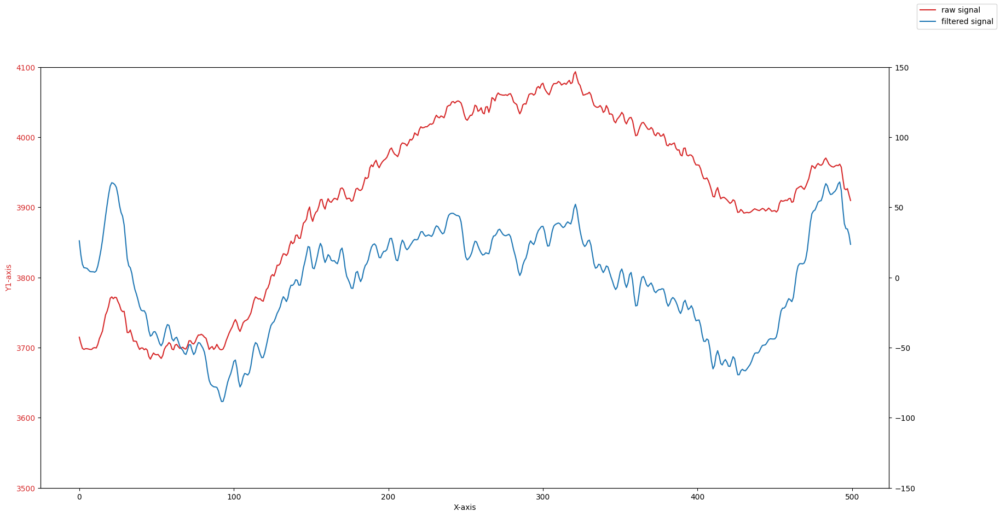

In [378]:
#Vẽ đồ thị cho thấy sự khác nhau giữa các tín hiệu chưa lọc và đã lọc
fig,ax = plt.subplots(1)
fig.set_size_inches(20,10)
ax.set_xlabel('X-axis')
ax.set_ylabel('Y1-axis', color = 'tab:red')
#Chọn bộ dữ liệu không tập trung làm đại diện để vẽ đồ thị trước và sau khi lọc
ax.plot(data_unfocus_before['eeg_record3'][0:500,0], color ='tab:red',label='raw signal')
ax.tick_params(axis ='y', labelcolor = 'tab:red')
#Trục Y1 (3500 - 4100) dành cho tín hiệu chưa lọc (raw signal) thể hiện biên độ gốc của tín hiệu EEG.
#Trục Y2 (-150 - 150) dành cho tín hiệu đã lọc (filtered signal), với biên độ nhỏ hơn sau khi loại bỏ các thành phần nhiễu.
ax.set_ylim(3500,4100)
# Adding Twin Axes to plot using dataset_2
ax0 = ax.twinx()
ax0.plot(data_unfocus['eeg_record3'][0:500,0],color='tab:blue',label='filtered signal')
ax0.set_ylim(-150,150)
fig.legend()
plt.show()

### **Kiểm tra các dải tầng số trong tín hiệu**

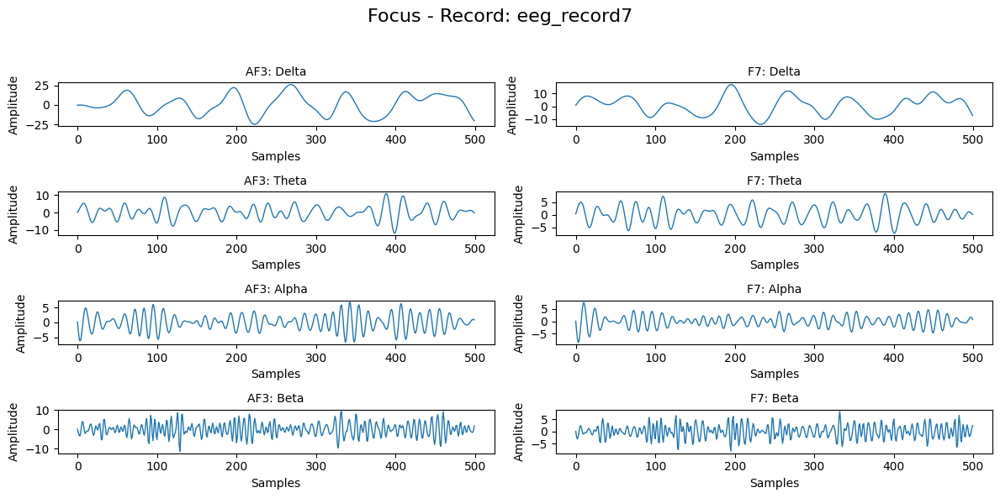

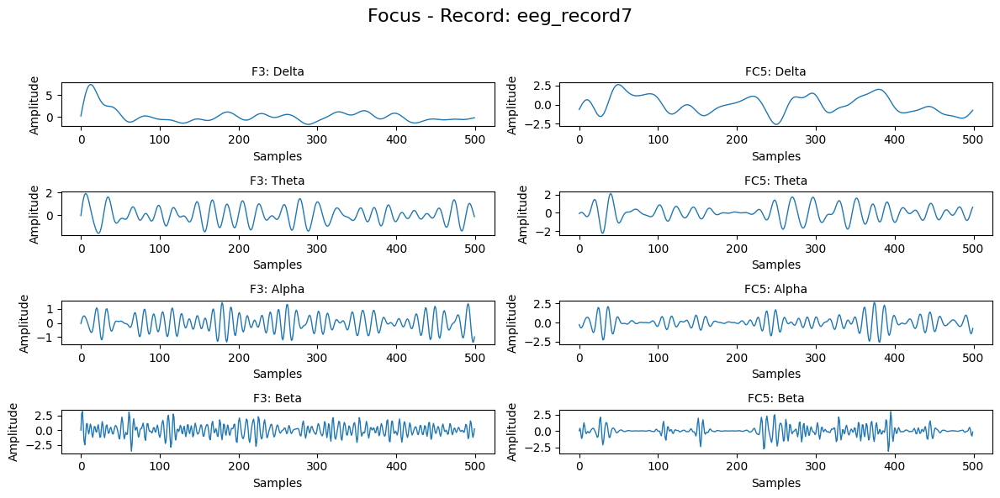

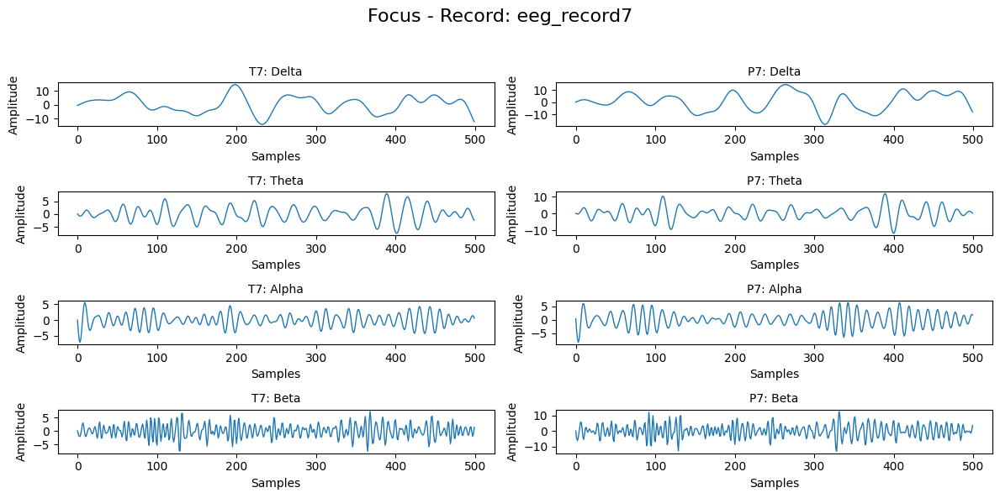

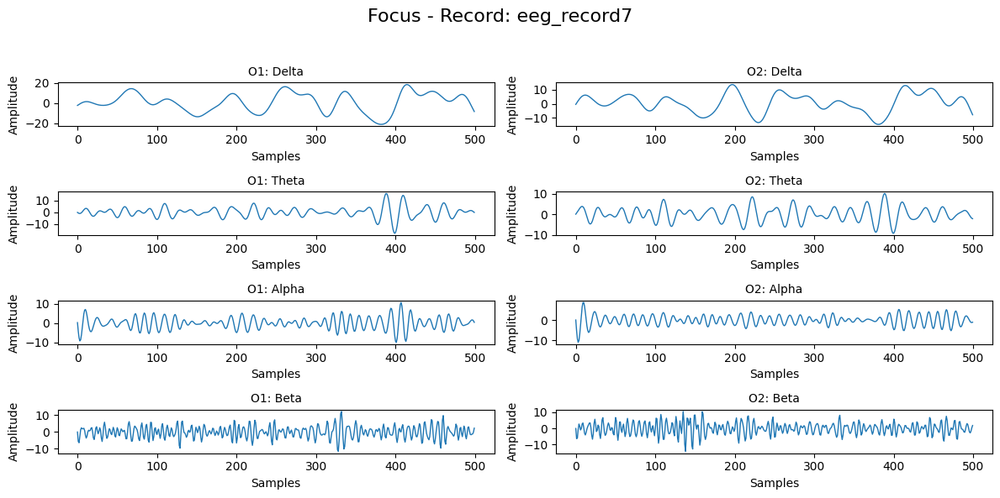

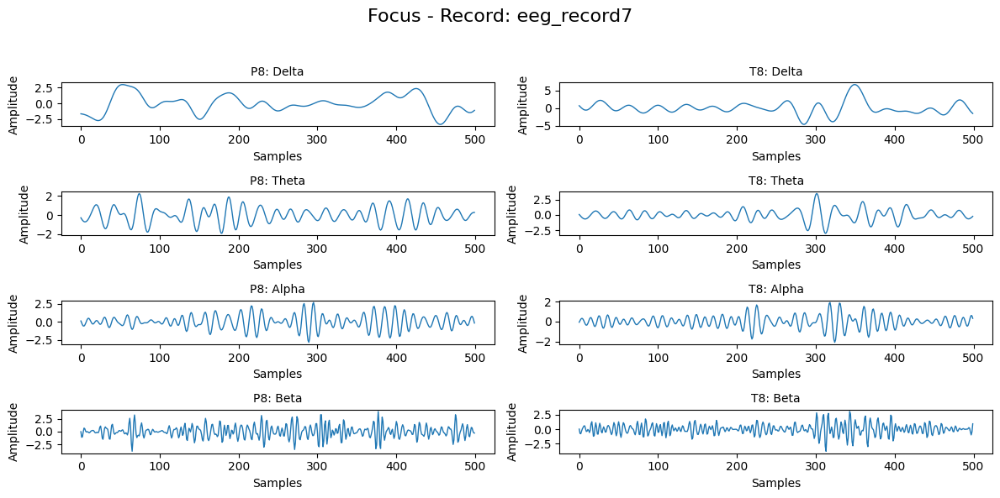

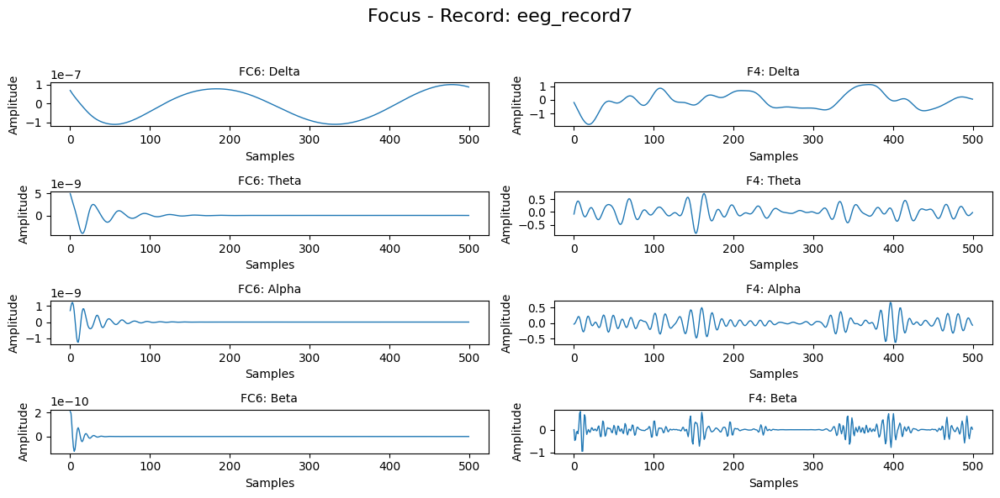

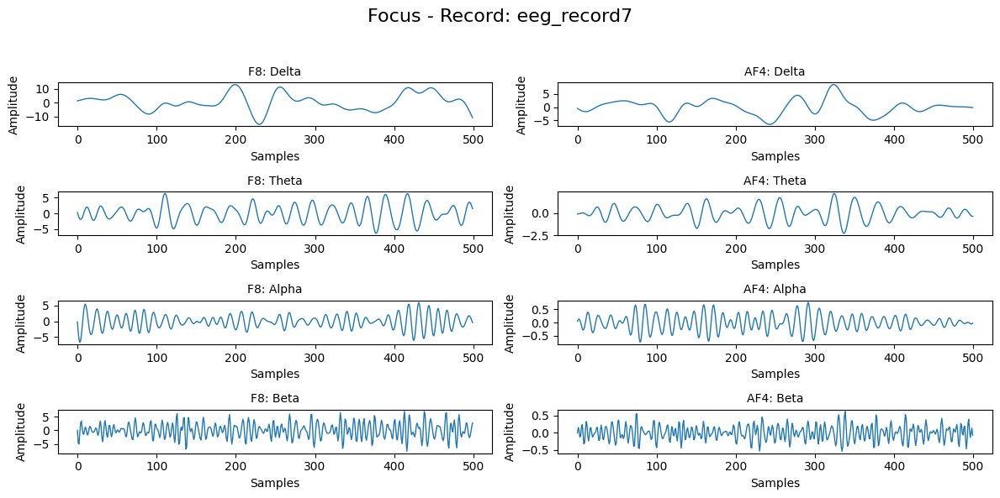

In [379]:

def plot_eeg_bands_by_channel(data_dict, fs, state_name, record_name):
    # Các dải tần EEG
    bands = [(0.5, 4, "Delta"), (4, 8, "Theta"), (8, 13, "Alpha"), (13, 30, "Beta")]

    # Lấy dữ liệu và thông tin số mẫu/kênh
    samples, channels = data_dict[record_name].shape

    for i in range(0, len(channels_name), 2):  # Xử lý từng 2 kênh một lần
        num_columns = min(2, len(channels_name) - i)  # Số cột phụ thuộc vào số kênh còn lại
        
        # Sử dụng GridSpec để kiểm soát bố cục
        fig = plt.figure(figsize=(12, 6))
        gs = gridspec.GridSpec(4, 2, figure=fig, width_ratios=[1, 1])  # Cân bằng tỉ lệ cột
        
        axs = []  # Lưu trữ các axes để tham chiếu
        for row in range(4):  # Mỗi hàng là một dải tần
            for col in range(num_columns):  # Mỗi cột là một kênh
                axs.append(fig.add_subplot(gs[row, col]))

        # Lặp qua các kênh
        for j, ch in enumerate(channels_name[i:i + num_columns]):
            for idx, (low, high, band) in enumerate(bands):
                ax = axs[idx * num_columns + j]  # Truy cập đúng subplot
                filtered_data = butter_bandpass_filter(data_dict[record_name][:, i + j], low, high, fs, 4)
                ax.plot(filtered_data[:500], label=f"{band} Band ({low}-{high} Hz)", color="tab:blue", linewidth=1)
                ax.set_title(f"{ch}: {band}", fontsize=10)
                ax.set_xlabel("Samples")
                ax.set_ylabel("Amplitude")

        fig.suptitle(f"{state_name} - Record: {record_name}", fontsize=16)
        plt.tight_layout(rect=[0, 0, 1, 0.95])  # Để tránh trùng tiêu đề
        plt.show()


plot_eeg_bands_by_channel(data_focus, FS, "Focus", 'eeg_record7')

**Delta (0.5-4 Hz):**

* Biên độ lớn nhất so với các dải khác.
* Tín hiệu dao động chậm (tần số thấp), biểu hiện rõ ràng qua số lượng sóng ít trên mỗi đoạn thời gian.

**Theta (4-8 Hz):**

* Biên độ nhỏ hơn Delta, nhưng vẫn tương đối đáng kể.
* Dao động nhanh hơn Delta, sóng xuất hiện nhiều hơn trong khoảng thời gian quan sát.


**Alpha (8-13 Hz):**

* Biên độ tiếp tục giảm so với Theta.
* Dao động nhanh hơn Theta, đặc trưng bởi sóng mịn hơn, số lượng nhiều hơn.

**Beta (13-30 Hz):**

* Biên độ nhỏ nhất trong tất cả các dải.
  
* Dao động rất nhanh, sóng xuất hiện dày đặc hơn, với tần số cao.


**Ta thấy trong mẫu được chọn để trực quan ở trên có những dải sóng trong một số kênh vẫn chưa ở đúng hình dạng sóng vốn có của nó có thể thấy điều này rõ nhất ở kênh FC6**

***→ Vẫn còn nhiễu trong tín hiệu, có thể là nhiễu cơ, nháy mắt, hoặc từ thiết bị điện***

## ICA - Independent Component Analysis

**Ta sẽ sử dụng ICA để lọc ra những nguồn tín hiệu nhiễu trong tín hiệu EEG. Có thể là nhiễu cơ, , nháy mắt hoặc cũng có thể là do thiết bị điện.**

**Sẽ thực hiện fit chung 1 lần và apply riêng 3 lần riêng cho 3 trạng thái (focus, unfocus, drowsy). Điều này đặc biệt hữu ích trong xử lý tín hiệu EEG khi bạn muốn tận dụng thông tin chung về các loại nhiễu giữa các trạng thái mà vẫn giữ được tính độc lập khi áp dụng:**

- Nhiễu như nháy mắt, tín hiệu cơ (EMG), hoặc nhiễu từ thiết bị thường xuất hiện ở tất cả các trạng thái. Fit ICA trên toàn bộ dữ liệu sẽ giúp ICA học tốt hơn các thành phần liên quan đến những loại nhiễu này.

- Điều này đảm bảo rằng các thành phần nhiễu được xác định chính xác và nhất quán trên tất cả các trạng thái.

- Số lượng mẫu tăng lên, điều này giúp ICA có đủ dữ liệu để học các thành phần độc lập một cách hiệu quả hơn

- Khi fit ICA chung, các ma trận trộn và tách được áp dụng giống nhau trên tất cả các trạng thái. Điều này giúp loại bỏ vấn đề không đồng nhất giữa các trạng thái khi bạn cần so sánh hoặc phân tích các đặc điểm tín hiệu

- Việc fit ICA trên từng trạng thái riêng biệt có thể tốn thời gian hơn nếu dữ liệu lớn. Fit ICA chung một lần giảm bớt tài nguyên tính toán và thời gian.

- Sau khi fit ICA trên toàn bộ dữ liệu, có thể apply từng phần dữ liệu của từng trạng thái. Điều này giúp giữ được sự linh hoạt trong việc xử lý và phân tích từng trạng thái một cách độc lập.

In [380]:
# Tạo một list data raw gồm tất cả trạng thái nối lại
def create_raw_from_dict(data_dict, sfreq=128):
    # Danh sách để lưu trữ các đối tượng RawArray
    raw_data_list = []
    
    # Lặp qua từng key tức các bản ghi trong dictionary
    for record_name, data in data_dict.items():
         # Tạo thông tin cho dữ liệu, bao gồm tên kênh, tần số mẫu và loại kênh
        info = mne.create_info(ch_names=channels_name, sfreq=sfreq, ch_types='eeg')
        # Dữ liệu cần được chuyển về dạng (n_channels, n_samples), do đó sử dụng `.T` để chuyển vị
        raw = mne.io.RawArray(data.T, info)
        # Thêm đối tượng RawArray vừa tạo vào danh sách
        raw_data_list.append(raw)
    # Nối các đối tượng RawArray lại với nhau
    return mne.concatenate_raws(raw_data_list) 
    
# Gộp tất cả dictionary
combined_data_dict = {**data_focus, **data_unfocus, **data_drowsy}
# Tạo Raw từ dữ liệu gộp
combined_raw = create_raw_from_dict(combined_data_dict)

Creating RawArray with float64 data, n_channels=14, n_times=76800
    Range : 0 ... 76799 =      0.000 ...   599.992 secs
Ready.
Creating RawArray with float64 data, n_channels=14, n_times=76800
    Range : 0 ... 76799 =      0.000 ...   599.992 secs
Ready.
Creating RawArray with float64 data, n_channels=14, n_times=76800
    Range : 0 ... 76799 =      0.000 ...   599.992 secs
Ready.
Creating RawArray with float64 data, n_channels=14, n_times=76800
    Range : 0 ... 76799 =      0.000 ...   599.992 secs
Ready.
Creating RawArray with float64 data, n_channels=14, n_times=76800
    Range : 0 ... 76799 =      0.000 ...   599.992 secs
Ready.
Creating RawArray with float64 data, n_channels=14, n_times=76800
    Range : 0 ... 76799 =      0.000 ...   599.992 secs
Ready.
Creating RawArray with float64 data, n_channels=14, n_times=76800
    Range : 0 ... 76799 =      0.000 ...   599.992 secs
Ready.
Creating RawArray with float64 data, n_channels=14, n_times=76800
    Range : 0 ... 76799 =      

### Apply ICA

In [381]:
montage = mne.channels.make_standard_montage('standard_1005')
combined_raw.set_montage(montage)

# Huấn luyện ICA trên dữ liệu gộp
ica = mne.preprocessing.ICA(n_components=14, random_state=97, max_iter=800)
# ICA được huấn luyện trên tín hiệu EEG
ica.fit(combined_raw)

Fitting ICA to data using 14 channels (please be patient, this may take a while)
Selecting by number: 14 components
Fitting ICA took 11.9s.


Method,fastica
Fit parameters,algorithm=parallelfun=logcoshfun_args=Nonemax_iter=800
Fit,27 iterations on raw data (1766400 samples)
ICA components,14
Available PCA components,14
Channel types,eeg
ICA components marked for exclusion,—


### **Thông tin về nhiễu cơ**

**Topomap (bản đồ đỉnh cao) :**

* Thành phần nhiễu cơ : Thường tập trung tại vùng ngoại vi (vùng ngoại vi), đặc biệt là gần các cơ (như vùng thái dương gần tai). Bản đồ thường có các tiêu điểm rõ ràng, với một hoặc nhiều tiêu điểm nhỏ (tiêu điểm).
* Trong khi các thành phần thần kinh thường trải rộng hoặc có độ mịn không gian cao (độ mịn không gian).

**Segment Image (hình ảnh đoạn) :**

* Thành phần nhiễu cơ bản: Hiển thị độ dốc giữa 7 Hz và 75 Hz (nếu chuyển đổi sang log-log).
Thường có cực tiểu ở khoảng 10 Hz và cực đại ở khoảng 25 Hz . Đây là cơ sở nhiễu phổ biến đặc biệt.
Cơ sở thường có năng lượng vượt trội ở các tần số cao (trên 75 Hz).
* Thành phần thần kinh: Phổ biến hơn và không hiển thị các đặc điểm như trên.

**ERP/ERF (trung bình tín hiệu thời gian) :**

* Thành phần nhiễu cơ: Tín hiệu thời gian không đều, "mờ", xuất hiện nhiều gai hoặc thay đổi đột ngột. Nếu các sự kiện xảy ra ở các khoảng cách đều nhau thì các đơn vị vận động (đơn vị vận động) có thể hoạt động.
* Thành phần thần kinh: Tín hiệu mượt mà hơn và có xu hướng hiện thị mẫu đặc trưng của hoạt động thần kinh.


**Phổ tần số :**

* Nhiễu cơ bản có xu hướng hiển thị độ dốc dương (độ dốc dương) giữa 7 Hz và 75 Hz trong phổ công suất (phổ công suất) nếu chuyển đổi sang log-log.
* Đặc biệt, phổ tần cơ thường có cực tiểu ở khoảng 10 Hz và cực đại ở khoảng 25 Hz , tạo ra một dạng đặc biệt.



**Variance (phân phối phương sai) :**

* Cơ chế thường có sai cao hơn và phân bố lệch, biểu hiện sự bất thường trong tín hiệu.
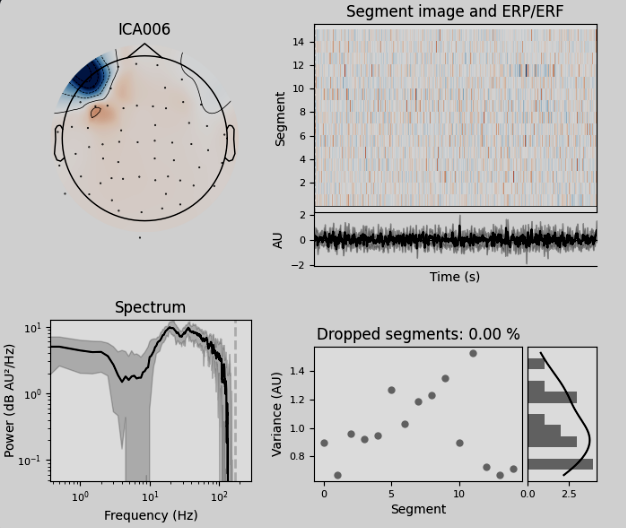

### **Các dạng sóng thường xuất hiện trong tín hiệu EEG**
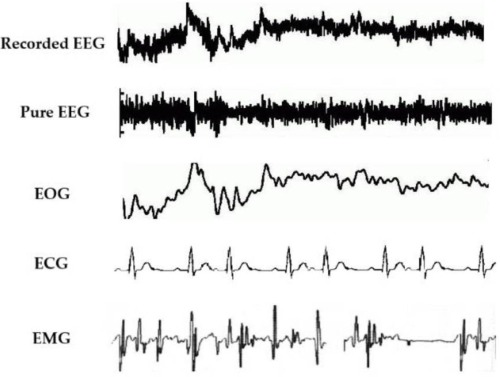 

Jiang, X., Bian, G.-B., & Tian, Z. (2019). Removal of artifacts from EEG signals: A review. Sensors, 19(5), 987. https://doi.org/10.3390/s19050987
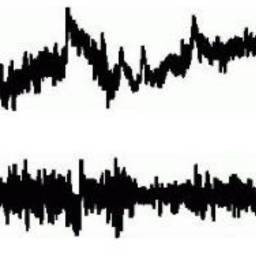
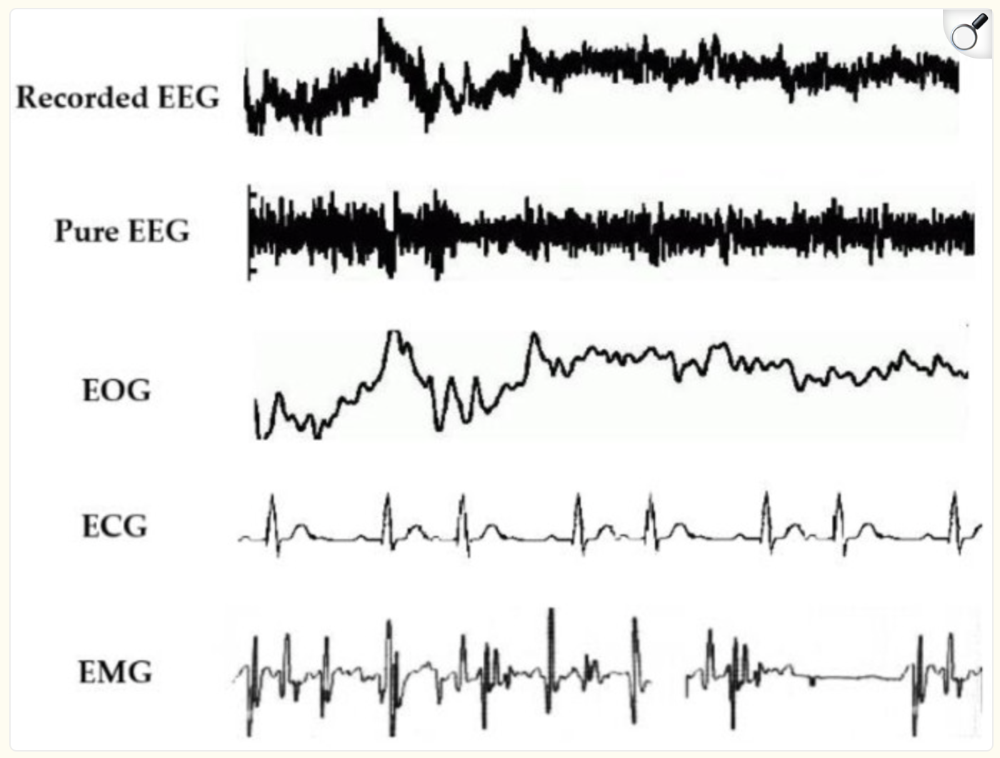
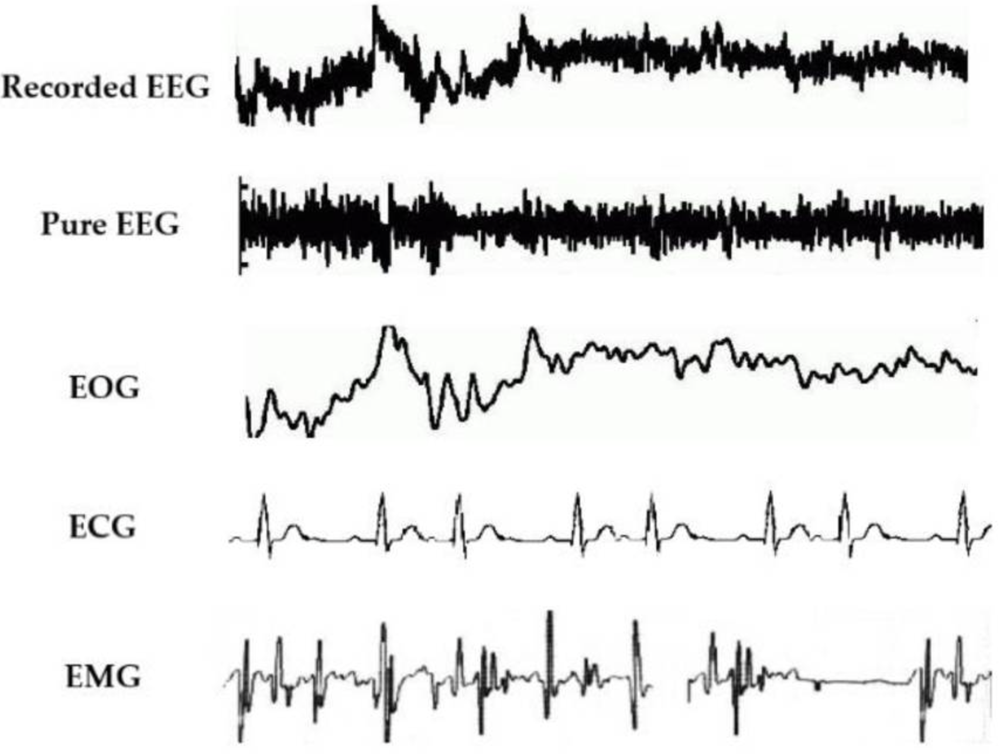

### Apply ICA

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
300 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
300 matching events found
No baseline correction applied
0 projection items activated
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
300 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
300 matching events found
No baseline correction applied
0 projection items activated
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
300 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
300 matching events found
No baseline correction applied
0 projection items activated
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
300 matching events found
No baseline correction applied
0 projection items activated
Not set

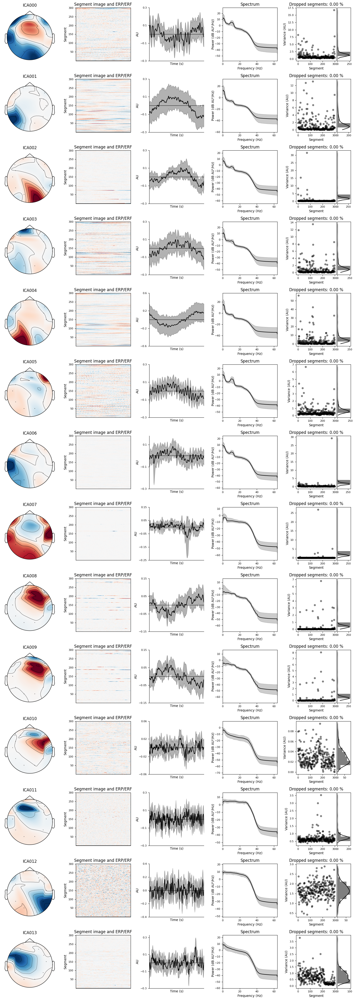

In [382]:
# Số lượng thành phần ICA
num_ica_components =14

# Tạo figure với layout hàng ngang
fig, axes = plt.subplots(
    num_ica_components, 5, figsize=(15, num_ica_components * 3)
)  # 5 trục cho mỗi thành phần ICA

# Lặp qua từng thành phần ICA
for i in range(num_ica_components):
    ica.plot_properties(
        combined_raw, picks=i, axes=axes[i], show=False
    )  # Mỗi hàng tương ứng với một thành phần

# Tinh chỉnh layout và hiển thị
plt.tight_layout()
plt.show()

Creating RawArray with float64 data, n_channels=14, n_times=1766400
    Range : 0 ... 1766399 =      0.000 ... 13799.992 secs
Ready.


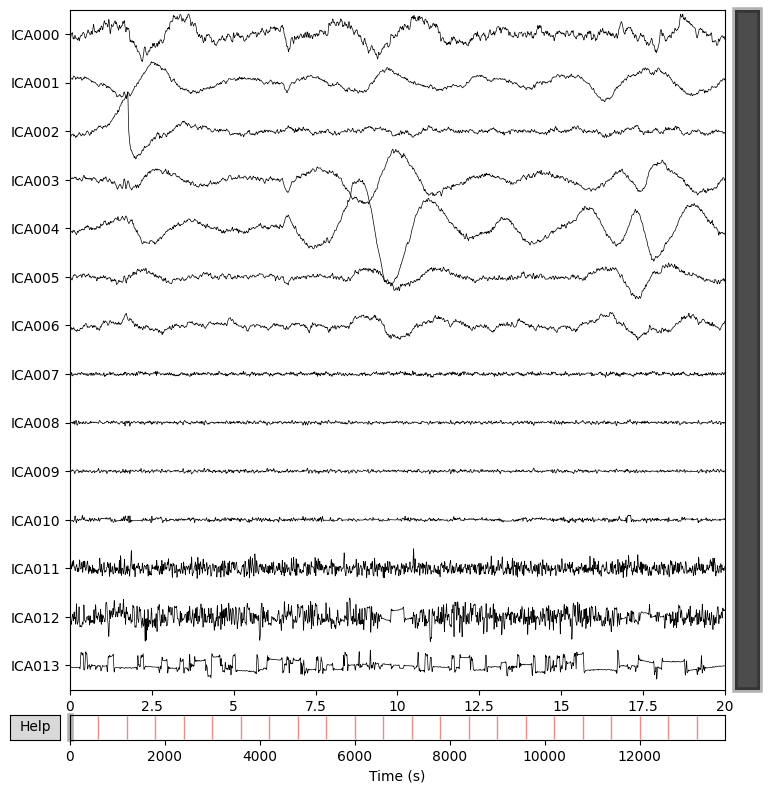

In [383]:
# Xem rõ hơn các dạng tín hiệu
fig = ica.plot_sources(combined_raw, show=False)
fig.show()

Creating RawArray with float64 data, n_channels=14, n_times=641
    Range : 0 ... 640 =      0.000 ...     5.000 secs
Ready.


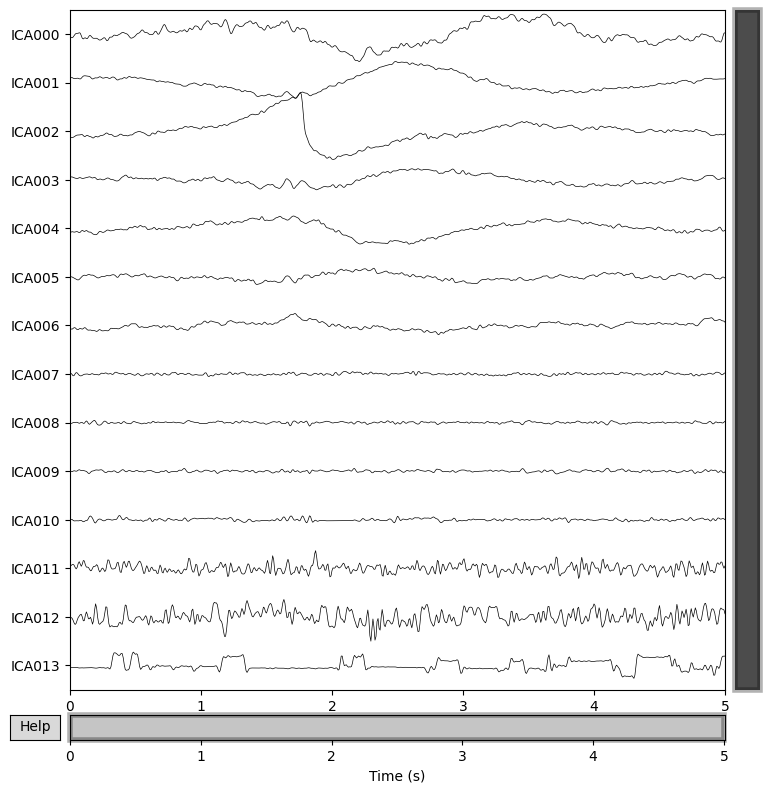

In [384]:
# Giới hạn khoảng thời gian từ 0 đến 5 giây để xem kĩ hơn tín hiệu
raw_cropped = combined_raw.copy().crop(tmin=0, tmax=5)

# Vẽ tín hiệu ICA với dữ liệu đã cắt
fig = ica.plot_sources(raw_cropped, show=False)
fig.show()

* **Ta thấy dạng tín hiệu của ICA011, ICA012, ICA013 có nhiều gai, hình dạng giống với nhiễu ECG (tín hiệu nhiễu điện từ tim) - có các nhịp giống như nhịp tim Và EMG (tín hiệu điện từ hoạt động của các cơ)**

**Ta có thể đối chiếu với hình ảnh bên dưới:**

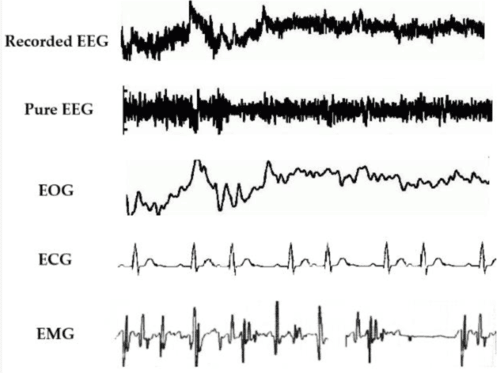


**→ Các thành phần nhiễu được chọn để loại bỏ:**  ICA011, ICA012, ICA013
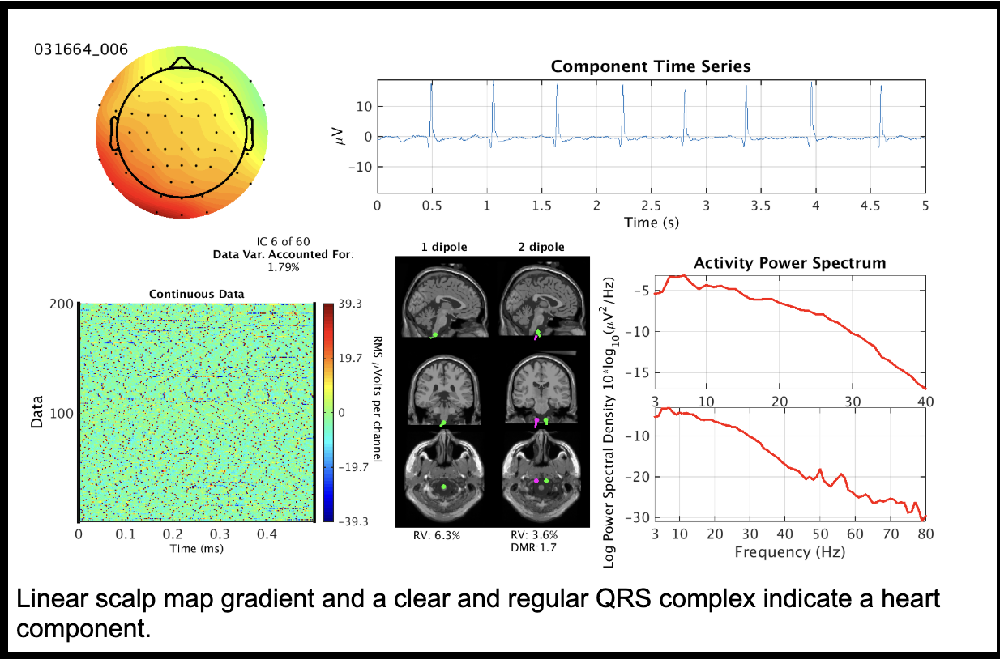
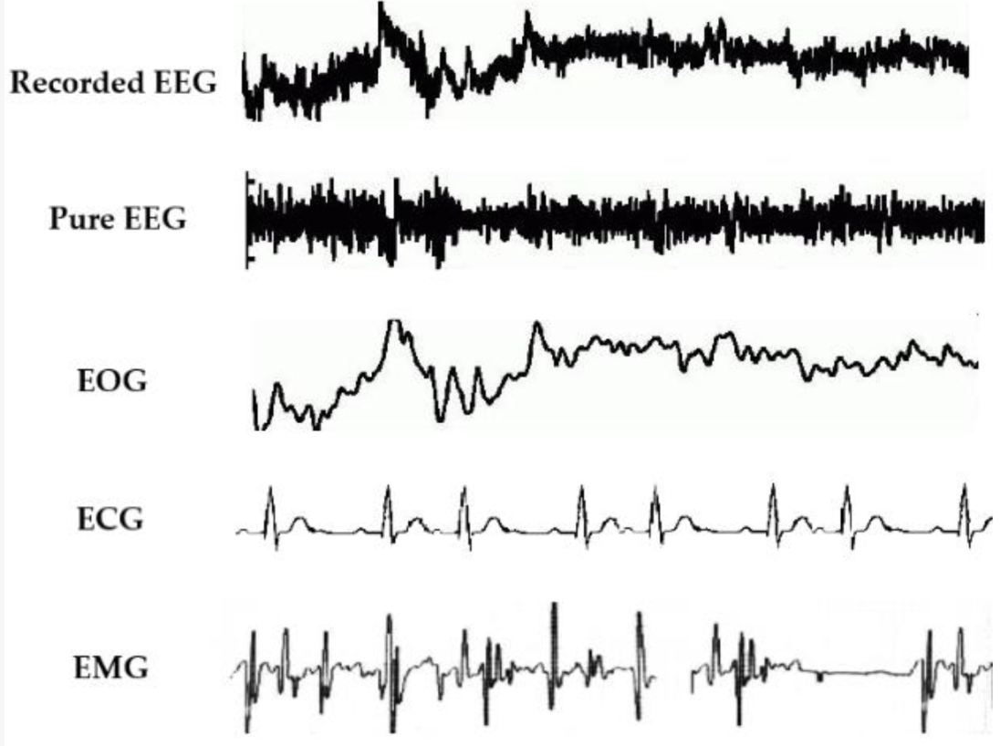

In [385]:
# loại bỏ các thành phần nhiễu
ica.exclude = [11, 12, 13] # Loại bỏ các thành phần nhiễu

# Hàm áp dụng ICA cho từng trạng thái riêng biệt
def apply_ica_to_dict(data_dict, ica):
    raw = create_raw_from_dict(data_dict)
    ica.apply(raw)  # Áp dụng ICA đã huấn luyện
    return raw.get_data()

# Áp dụng ICA đã huấn luyện cho từng trạng thái
processed_focus = apply_ica_to_dict(data_focus, ica)
processed_unfocus = apply_ica_to_dict(data_unfocus, ica)
processed_drowsy = apply_ica_to_dict(data_drowsy, ica)

Creating RawArray with float64 data, n_channels=14, n_times=76800
    Range : 0 ... 76799 =      0.000 ...   599.992 secs
Ready.
Creating RawArray with float64 data, n_channels=14, n_times=76800
    Range : 0 ... 76799 =      0.000 ...   599.992 secs
Ready.
Creating RawArray with float64 data, n_channels=14, n_times=76800
    Range : 0 ... 76799 =      0.000 ...   599.992 secs
Ready.
Creating RawArray with float64 data, n_channels=14, n_times=76800
    Range : 0 ... 76799 =      0.000 ...   599.992 secs
Ready.
Creating RawArray with float64 data, n_channels=14, n_times=76800
    Range : 0 ... 76799 =      0.000 ...   599.992 secs
Ready.
Creating RawArray with float64 data, n_channels=14, n_times=76800
    Range : 0 ... 76799 =      0.000 ...   599.992 secs
Ready.
Creating RawArray with float64 data, n_channels=14, n_times=76800
    Range : 0 ... 76799 =      0.000 ...   599.992 secs
Ready.
Creating RawArray with float64 data, n_channels=14, n_times=76800
    Range : 0 ... 76799 =      

In [386]:
# Chuyển về dạng dictionary ban đầu
def convert_processed_to_dict(processed_data, original_dict):
    """
    Chuyển dữ liệu đã qua xử lý từ dạng mảng về lại dictionary gốc.

    Parameters:
    - processed_data: numpy array (dữ liệu sau xử lý, kích thước: n_channels x total_samples).
    - original_dict: dictionary gốc chứa thông tin về số mẫu của từng record.

    Returns:
    - dict: Dictionary khôi phục theo cấu trúc gốc.
    """
    restored_dict = {}
    start_idx = 0  # Chỉ số bắt đầu cho mỗi record

    for record_name, original_data in original_dict.items():
        print(f"Record name: {record_name}")
        n_samples = original_data.shape[0]  # Số mẫu của record gốc
        n_channels = original_data.shape[1]  # Số kênh

        # Lấy đúng đoạn dữ liệu đã xử lý cho record này
        restored_dict[record_name] = processed_data[:, start_idx:start_idx + n_samples].T
        
        # Cập nhật chỉ số bắt đầu cho record tiếp theo
        start_idx += n_samples

    return restored_dict

# Chuyển dữ liệu đã xử lý về dictionary gốc
restored_focus = convert_processed_to_dict(processed_focus, data_focus)
restored_unfocus = convert_processed_to_dict(processed_unfocus, data_unfocus)
restored_drowsy = convert_processed_to_dict(processed_drowsy, data_drowsy)

# Kiểm tra kết quả
print(f"Số record trong data_focus gốc: {len(data_focus)}")
print(f"Số record trong restored_focus: {len(restored_focus)}")

Record name: eeg_record3
Record name: eeg_record4
Record name: eeg_record5
Record name: eeg_record6
Record name: eeg_record7
Record name: eeg_record10
Record name: eeg_record11
Record name: eeg_record12
Record name: eeg_record13
Record name: eeg_record14
Record name: eeg_record17
Record name: eeg_record18
Record name: eeg_record19
Record name: eeg_record20
Record name: eeg_record21
Record name: eeg_record24
Record name: eeg_record25
Record name: eeg_record26
Record name: eeg_record27
Record name: eeg_record31
Record name: eeg_record32
Record name: eeg_record33
Record name: eeg_record34
Record name: eeg_record3
Record name: eeg_record4
Record name: eeg_record5
Record name: eeg_record6
Record name: eeg_record7
Record name: eeg_record10
Record name: eeg_record11
Record name: eeg_record12
Record name: eeg_record13
Record name: eeg_record14
Record name: eeg_record17
Record name: eeg_record18
Record name: eeg_record19
Record name: eeg_record20
Record name: eeg_record21
Record name: eeg_recor

#### **Kiểm tra lại dạng sóng của các dải sóng sau khi lọc nhiễu bằng ICA**
Thực hiện trên trạng thái focus của 'eeg_record7' như ở trên

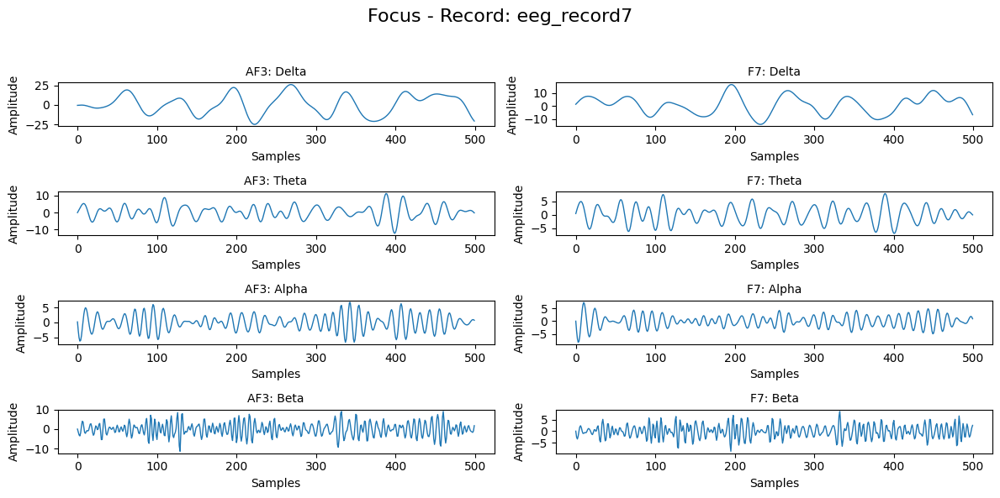

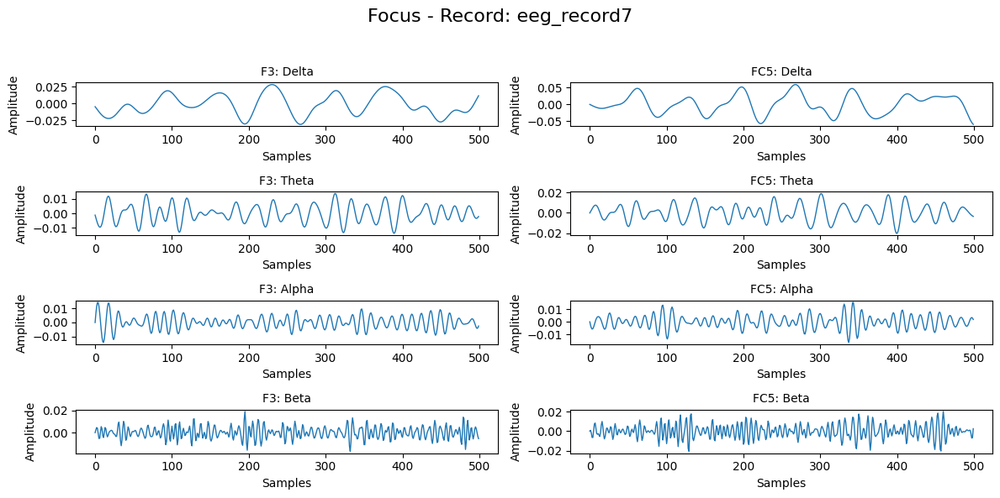

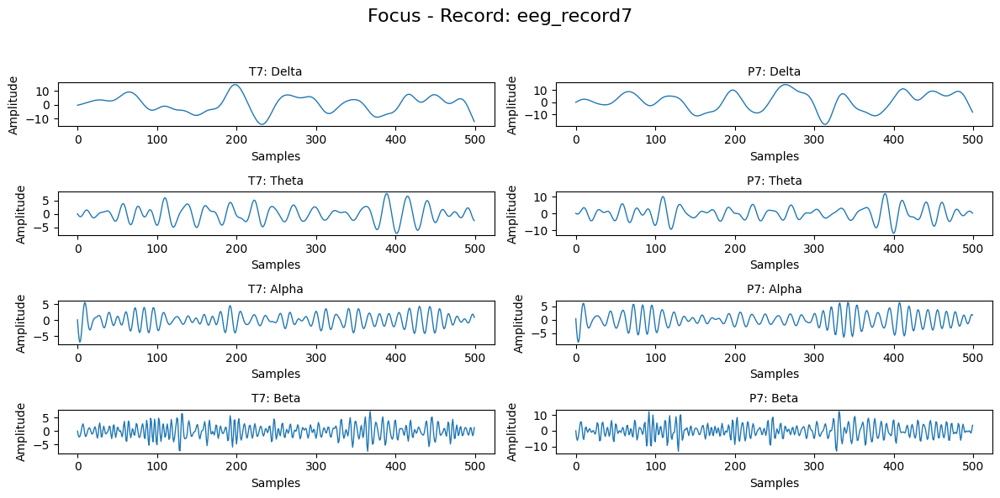

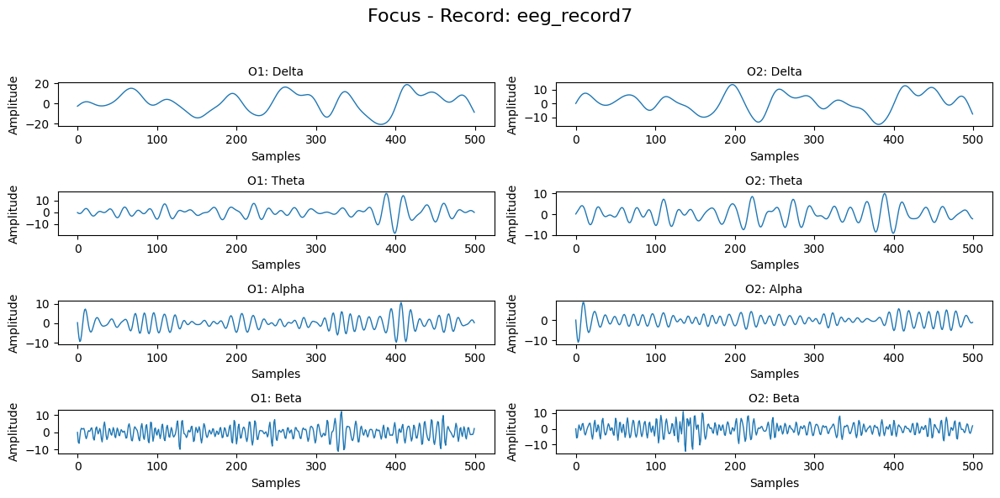

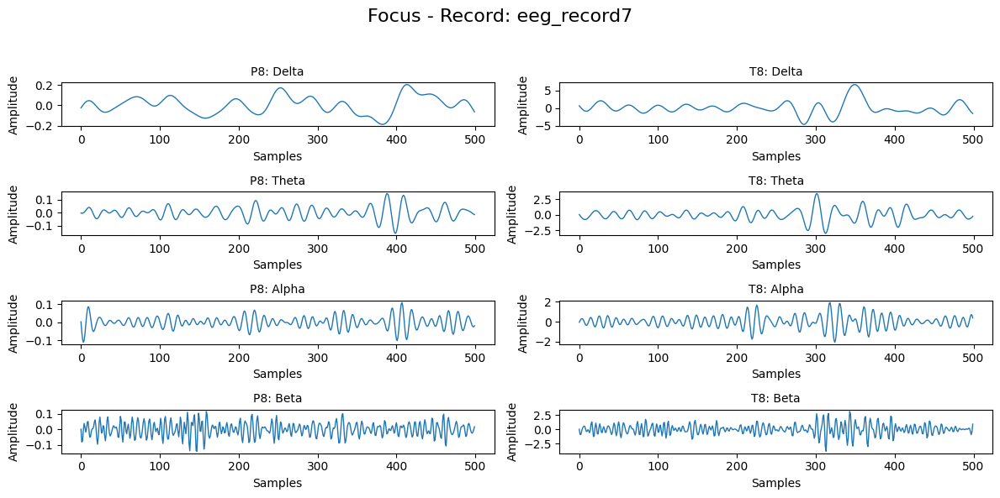

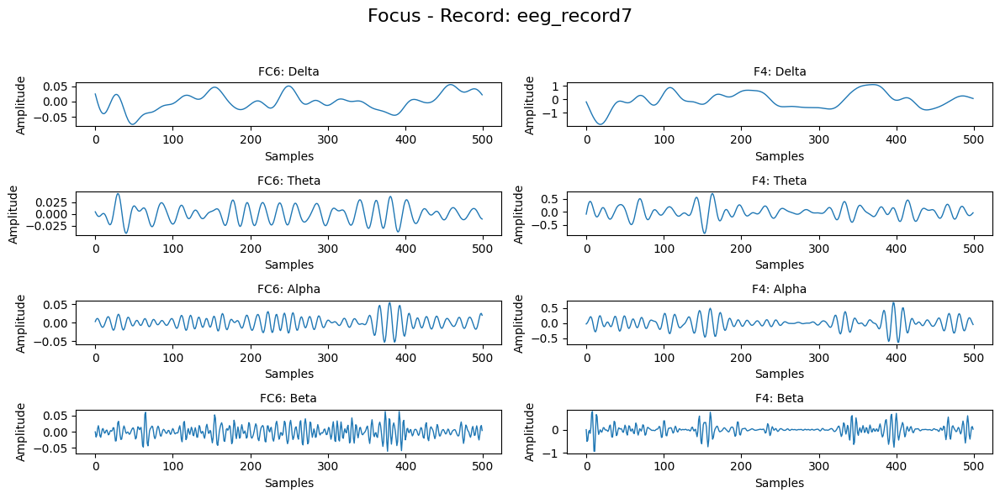

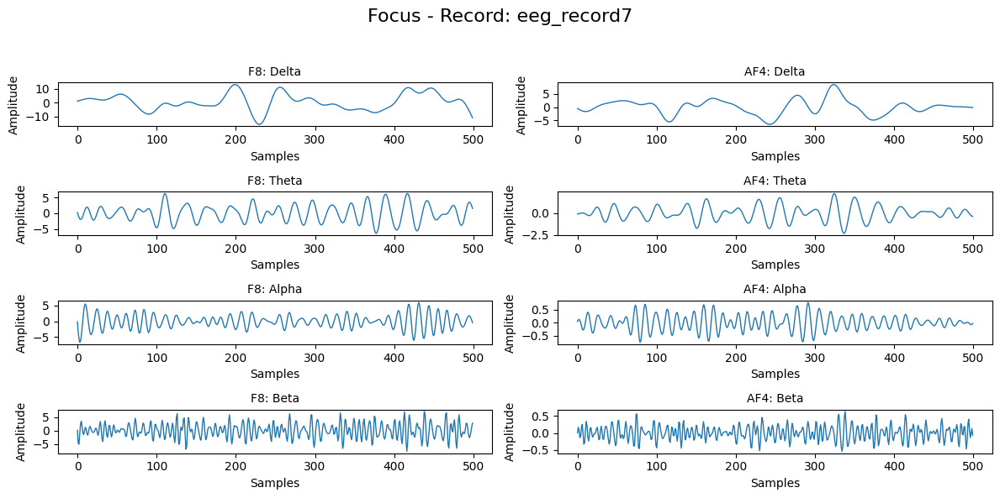

In [387]:
plot_eeg_bands_by_channel(restored_focus, FS, "Focus", 'eeg_record7')

* ***Ta dễ dàng nhận thấy được sự khác nhau về hình dạng của các dải sóng trong kênh FC6 trước và sau khi thực hiện ICA***
* ***Các dải sóng sau khi ICA đã trờ về đúng định dạng nên có của chúng***

# FEATURE ENGINEERING

## Fourier Transform & Features Extraction 

- Fourier transform được dùng để chuyển đổi tín hiệu từ time domain sang frequency domain. Từ đó ta sẽ có thể rút ra được các đặc điểm về tần số.
- Dưới đây là Spectrogram được vẽ từ channel AF3 của bản ghi eeg_record3 theo từng giai đoạn state.

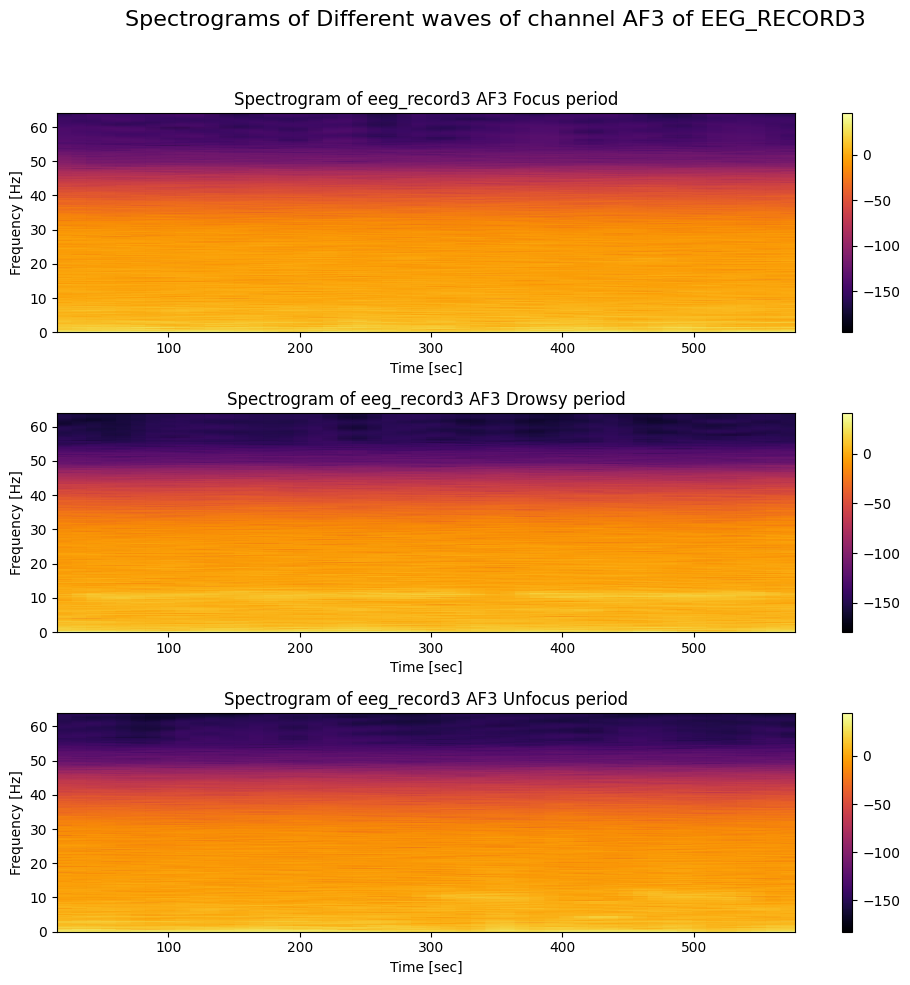

In [509]:
titles = [
          "Spectrogram of eeg_record3 AF3 Focus period",
          "Spectrogram of eeg_record3 AF3 Drowsy period",
          "Spectrogram of eeg_record3 AF3 Unfocus period"
         ]

signals = [
    restored_focus["eeg_record3"][:, 0],
     restored_drowsy["eeg_record3"][:, 0],
     restored_unfocus["eeg_record3"][:, 0],
    
]

# Thiết lập subplot: 3 hàng, 1 cột
fig, axes = plt.subplots(3, 1, figsize=(10, 10))
fig.suptitle('Spectrograms of Different waves of channel AF3 of EEG_RECORD3', fontsize=16)

# Vẽ spectrogram cho từng tín hiệu
for i, ax in enumerate(axes):
    f, t_spec, Sxx = spectrogram(signals[i], fs=128, nperseg=128*30, noverlap=960)
    pcm = ax.pcolormesh(t_spec, f, 10 * np.log10(Sxx), shading='gouraud', cmap='inferno')
    ax.set_title(titles[i])
    ax.set_ylabel('Frequency [Hz]')
    ax.set_xlabel('Time [sec]')
    fig.colorbar(pcm, ax=ax, orientation='vertical')

# Điều chỉnh khoảng cách giữa các subplot
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

- Nhận xét:
  - Ở cả 3 giai đoạn có thể thấy năng lượng phổ tập trung chủ yếu ở những dải tần:
    - delta : 0.5 - 4 (Hz)
    - theta : 4 - 8 (Hz)
    - alpha : 8 - 13 (Hz)
    - beta : 13 - 30 (Hz)
  - Ở giai đoạn focus năng lượng phổ của các dải tầng không có gì quá biến động.
  - Ở giai đoạn drowsy ta thấy năng lượng ở xung quanh tần số 10Hz tức là thuộc dải tần alpha có phần vượt trội và nổi bật hơn những phần còn lại.
  - Ở giai đoạn unfocus, vào những giai đoạn cuối, năng lượng của dải alpha có biến động mạnh nhẹ 

### Tạo bộ dữ liệu cho việc xây dựng mô hình

- Như đã nói ở trên, các dải tầng sóng như alpha, beta, theta và delta ở mỗi channel có mối liên hiện với trạng thái của não. Thế nên để phục vụ cho phần xây dựng mô hình ta sẽ xây dựng một bộ dữ liệu mới dựa trên dữ liệu cũ mà các feature của nó là các đặc trưng của các dải tần sóng đã nêu trên ở mỗi channel. Để trích được những đặc trưng đó ta sẽ cần sử dựng FT (Fourier Transform).
- Ở phần trên, ta đã chia tín hiệu thành các restored_state mà trong đó chỉ chứa những đoạn record liên tục thuộc cùng 1 state trong các file record. Điều này giúp cho các dữ liệu sẽ luôn luôn cùng state mà không bị lẫn vào nhau gây khó khăn khi label.
- Với mỗi restored_state như vậy, ở mỗi file ta sẽ chia đoạn record thành những đoạn record con gọi là window.
- Những window này sẽ được ta sử dụng FT trên từng channel. Mỗi channel sẽ được xét các dải tần và trích xuất đặc trưng trong từng dải tầng trong window đó.
- Các đặc trưng của dải tầng được trích xuất:
    - power_band : là năng lượng của dải tần (công suất phổ) trong đoạn tín hiệu --> Thể hiện được độ đóng góp của dải tần vào toàn bộ tín hiệu.
    - mean_power : là trung bình của năng lượng dải tần, đồng thời đó đây cũng là mật độ công suất phổ --> thể hiện sự phân bố năng lượng của dải tần lên các thành phần tần số của nó.
    - max_power : công suất lớn nhất trong dải tần.
    - peak_power : thành phần tần số có công suất lớn nhất trong dải tần.
    - std_power : độ lệch chuẩn của công suất.
    - cv : hệ số biến thiên --> thể hiện sự phân tán của năng lượng.
    - ratio_power_band : là tỉ số giữa công suất dải tầng với công suất toàn bộ tín hiệu --> chuẩn hóa tỉ lệ đóng góp các dải tầng với nhau trong toàn bộ tín hiệu.
- Mỗi window sẽ có nhãn state trùng với restored_state của nó. VD: window được tạo từ restored_focus thì state của nó là 'focus' (có thể sẽ được số hóa)
- Như vậy mỗi window sau khi được chuyển đổi thành một điểm sẽ có số feature là: 14 * 4 * 7 + 1 = 393

In [514]:
class FrequencyDomainProcessor:
    def __init__(self, important_waves, list_of_day_record):
        """
        Khởi tạo lớp xử lý với thông tin về các dải tần số.

        Args:
            important_waves (dict): Từ điển chứa tên dải sóng và khoảng tần số (tuple).
            list_of_record_day (list, numpy array): Danh sách các ngày record
        """
        self.important_waves = important_waves
        self.day_record = list_of_day_record

    def calculate_power_band(self, xf, yf, band):
        """
        Tính năng lượng của một dải tần số nhất định.
        
        Args:
            xf (numpy array): Mảng tần số.
            yf (numpy array): Phổ Fourier của tín hiệu.
            band (tuple): Khoảng tần số cần tính năng lượng.
        
        Returns:
            float: Năng lượng của dải tần.
        """
        low, high = band
        amplitude = np.abs(yf)  # Biên độ của phổ Fourier
        power = np.sum(amplitude[(xf >= low) & (xf < high)]**2) / len(xf)
        return power

    def get_features_from_one_channel(self, xf, yf):
        """
        Trích xuất các đặc trưng từ một kênh tín hiệu.
        
        Args:
            xf (numpy array): Mảng tần số.
            yf (numpy array): Phổ Fourier của tín hiệu.
        
        Returns:
            numpy array: Các đặc trưng của kênh.
        """
        features = []
        N = len(xf)
        total_power = np.sum(np.abs(yf)**2) / N  # Tổng năng lượng

        for wave_name, band in self.important_waves.items():
            # Lọc tín hiệu trong dải tần xác định
            x_band = xf[(xf >= band[0]) & (xf < band[1])]
            y_band = yf[(xf >= band[0]) & (xf < band[1])]
            S = (1 / N) * np.abs(y_band)**2  # Mật độ năng lượng

            # Tính các đặc trưng
            power_band = np.sum(S)
            mean_power = np.mean(S)
            max_power = np.max(S)
            std_power = np.std(S,ddof=1)
            peak_power = x_band[np.argmax(S)]
            ratio_power_band = power_band/total_power
            cv = std_power/mean_power

            # Thêm các đặc trưng vào danh sách
            features.extend([power_band, mean_power, max_power, std_power, peak_power, ratio_power_band, cv])

        return np.array(features)

    def get_features_from_window(self, window, fs):
        """
        Trích xuất các đặc trưng từ một cửa sổ dữ liệu.

        Args:
            window (numpy array): Cửa sổ tín hiệu (N, C + state).
            fs (int): Tần số lấy mẫu.

        Returns:
            numpy array: Đặc trưng của cửa sổ (C*24,).
        """
        features = []
        for channel in range(window.shape[1] - 1):  # Duyệt qua từng kênh (không tính cột trạng thái)
            # Sử dụng fourier transform cho từng channel của window
            yf = fft(window[:, channel])  # Phổ Fourier của kênh
            xf = fftfreq(window.shape[0], 1 / fs)  # Tần số tương ứng
            features.extend(self.get_features_from_one_channel(xf, yf))

        # Thêm nhãn trạng thái (cột cuối cùng)
        features.append(window[0, -1])
        return np.array(features)

    def get_window(self, restored_state, window_size, overlap):
        """
        Tạo các cửa sổ dữ liệu từ một tín hiệu.

        Args:
            restored_state (dict): Dữ liệu tín hiệu (từ điển).
            window_size (int): Kích thước cửa sổ.
            overlap (int): Phần trùng lặp giữa các cửa sổ.

        Returns:
            list: Danh sách các cửa sổ (numpy arrays).
        """
        windows = []
        for record_name, data in restored_state.items():
            start = 0
            end = start + window_size

            while end <= data.shape[0]:  # Tạo các cửa sổ đủ kích thước
                windows.append(data[start:end, :])
                start = start + window_size - overlap
                end = start + window_size

            if end > data.shape[0]:  # Xử lý cửa sổ cuối cùng bằng zero padding
                zero_padding = np.zeros((window_size - (data.shape[0] - start), data.shape[1]))
                last_window = np.concatenate((data[start:, :], zero_padding), axis=0)
                windows.append(last_window)

        return windows

    def add_state(self, restored_data, state_name):
        """
        Tạo một restored_data mới có chứa state

        Args:
            restored_data (dict) : bản ghi của dữ liệu trong 1 state nhất định
                                    key (string): tên của bản ghi
                                    value (numpy array): tín hiệu của 14 channel, shape (N,14)
                                    
            state_name (string) : tên của state được thêm vào

        Return:
            restored_data đã được thêm state vào, với key có shape (N, 14 +1)
        """
        # Tạo dictonary mới
        new_restored_data={}

        # Thêm cột state vào từng file record
        for record_name in restored_data.keys():
            # tạo cột state
            state= np.array([state_name]*restored_data[record_name].shape[0]).reshape(-1,1)
            # thêm các record có state vào dict mới
            new_restored_data[record_name]= np.concatenate((restored_data[record_name],state), axis=1)
            
        return new_restored_data

    def get_features_from_data(self, restored_focus, restored_drowsy, restored_unfocus, fs, window_size, overlap):
        """
        Get features from data
        
        Args:
            restored_focus (dict): the record of the focus data of each file record
                                    key (string): name of the record file
                                    value (numpy array): the record shape (N, 14)
            
            restored_drowy (dict): the record of the drowsy data of each file record
                                    key (string): name of the record file
                                    value (numpy array): the record shape (N, 14)
                                    
             restored_unfocus (dict): the record of the unfocus data of each file record
                                    key (string): name of the record file
                                    value (numpy array): the record shape (N, 14)                                               
            
            fs (int): sampling frequency (Hz)
            window_size (int): size of window
            overlap (int): overlap of window
            
        Returns:
            numpy array: features shape (M, 393)
        """
        features = []

        # Thêm nhãn trạng thái vào dữ liệu
        new_restored_focus = self.add_state(restored_focus, 0)
        new_restored_unfocus = self.add_state(restored_unfocus, 1)
        new_restored_drowsy = self.add_state(restored_drowsy, 2)

        # Tạo các cửa sổ từ dữ liệu
        focus_windows = self.get_window(new_restored_focus, window_size, overlap)
        unfocus_windows = self.get_window(new_restored_unfocus, window_size, overlap)
        drowsy_windows = self.get_window(new_restored_drowsy, window_size, overlap)

        # Tổng hợp các cửa sổ
        total_windows = [*focus_windows, *unfocus_windows, *drowsy_windows]

        # Trích xuất đặc trưng từ từng cửa sổ
        for window in total_windows:
            features.append(self.get_features_from_window(window, fs))

        return np.array(features)

    def get_train_test_feature_set(self, restored_focus, restored_drowsy, restored_unfocus, fs, window_size, overlap, day_train, day_test = None, random_state = None):
        """
        Tạo tập data train và test dựa trên các restored_state, với day ngày đầu dùng cho train và những ngày còn lại dành cho test.

        Args:
            restored_focus (dict): the record of the focus data of each file record
                                    key (string): name of the record file
                                    value (numpy array): the record shape (N, 14)
            
            restored_drowy (dict): the record of the drowsy data of each file record
                                    key (string): name of the record file
                                    value (numpy array): the record shape (N, 14)
                                    
             restored_unfocus (dict): the record of the unfocus data of each file record
                                    key (string): name of the record file
                                    value (numpy array): the record shape (N, 14)                                               
            
            fs (int): sampling frequency (Hz)
            window_size (int): size of window
            overlap (int): overlap of window
            end_of_day_train (int): the last day for the train set
            end_of_day_test (int) : the last day for the test set
        """
        base_name= 'eeg_record'
        if day_test == None:
            day_test = len(self.day_record)

        # tạo danh sách các bản ghi của từng list train và test
        train_day_list = list()
        test_day_list = list()

        for i in range(len(self.day_record)):
            if i < day_train:
                train_day_list.extend(self.day_record[i])
            elif i < day_test:
                test_day_list.extend(self.day_record[i])
            else:
                continue
                
        # Tiến hành tạo những restored_state cho việc train và test      
        # train restored_data
        train_focus = {base_name + str(index) : restored_focus[base_name + str(index)] for index in train_day_list}
        train_drowsy = {base_name + str(index) : restored_drowsy[base_name + str(index)] for index in train_day_list}
        train_unfocus = {base_name + str(index) : restored_unfocus[base_name + str(index)] for index in train_day_list}

        # test restored data
        test_focus = {base_name + str(index) : restored_focus[base_name + str(index)] for index in test_day_list}
        test_drowsy = {base_name + str(index) : restored_drowsy[base_name + str(index)] for index in test_day_list}
        test_unfocus = {base_name + str(index) : restored_unfocus[base_name + str(index)] for index in test_day_list}

        # tạo bộ train test feature (đã bao gồm nhãn state)
        train_feature = self.get_features_from_data(train_focus, train_drowsy, train_unfocus,fs, window_size, overlap)
        test_feature = self.get_features_from_data(test_focus, test_drowsy, test_unfocus,fs, window_size, overlap)

        # trộn lại bộ train
        # khởi tạo seed random cục bộ
        rng = np.random.default_rng(random_state)
        rng.shuffle(train_feature)
        return train_feature, test_feature
    

In [539]:
day_record = [
    [3, 10, 17, 24, 31],
    [4, 11, 18, 25, 32],
    [5, 12, 19, 26, 33],
    [6, 13, 20, 27, 34],
    [7, 14, 21]
]
# band của các dải tầng quan tâm
IMPORTANT_WAVES = {
    'delta': (0.3, 4),  
    'theta': (4, 8),
    'alpha': (8, 13),
    'beta': (13, 30)
}

# Tạo đối tượng xử lý
fre_processor = FrequencyDomainProcessor(important_waves=IMPORTANT_WAVES,list_of_day_record=day_record)

# Các thông số truyền vào
fs = 128  # Tần số lấy mẫu 128 Hz
window_size = 128*30  # Kích thước cửa sổ: 230giây
overlap = 1920  # 50%

total_set_feature = fre_processor.get_features_from_data(restored_focus, restored_drowsy, restored_unfocus, fs,window_size, overlap)

### Tạo và nhận xét bộ feature mới

In [540]:
# Tạo tên cho các cột thuộc tính
LIST_BASE_FEATURES = ['power', 'mean_power','max_power',  'std_power', 'peak_power','ratio_power','cv']
FULL_FEATURES = [f"{channel}_{wave}_{base_feature}" for channel in channels_name for wave in IMPORTANT_WAVES.keys() for base_feature in LIST_BASE_FEATURES] + ['state']

# Tạo dataframe
df = pd.DataFrame(total_feature, columns=FULL_FEATURES)
df.head()

,AF3_delta_power,AF3_delta_mean_power,AF3_delta_max_power,AF3_delta_std_power,AF3_delta_peak_power,AF3_delta_ratio_power,AF3_delta_cv,AF3_theta_power,AF3_theta_mean_power,AF3_theta_max_power,...,AF4_alpha_ratio_power,AF4_alpha_cv,AF4_beta_power,AF4_beta_mean_power,AF4_beta_max_power,AF4_beta_std_power,AF4_beta_peak_power,AF4_beta_ratio_power,AF4_beta_cv,state
0,1.455237e+06,13859.397510,327754.213164,41327.276811,0.566667,0.216090,2.981896,104540.628024,871.171900,3950.499363,...,0.007334,0.965152,476.783534,0.934870,11.924070,1.652983,13.866667,0.003962,1.768142,0.0
1,6.071159e+05,5782.055954,153033.924957,16313.207846,0.500000,0.107994,2.821351,83006.254965,691.718791,4623.958303,...,0.009267,1.142319,322.766557,0.632876,11.057283,1.102617,14.033333,0.004723,1.742233,0.0
2,1.502105e+06,14305.763889,556083.273289,58345.664510,0.500000,0.248281,4.078472,50836.838228,423.640319,2044.709150,...,0.016797,1.124946,237.123935,0.464949,18.103933,1.163447,13.000000,0.006395,2.502312,0.0
3,1.361834e+06,12969.845776,336278.505703,40297.874764,0.633333,0.206148,3.107043,43114.336185,359.286135,3126.504238,...,0.106322,1.725645,203.724778,0.399460,16.237237,1.141067,13.666667,0.107651,2.856522,0.0
4,1.040544e+06,9909.942251,204568.449038,30682.683576,0.533333,0.191117,3.096152,68579.807296,571.498394,3059.241430,...,0.144297,1.422960,220.174313,0.431714,13.300796,0.996891,13.666667,0.153986,2.309144,0.0


In [541]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1863 entries, 0 to 1862
Columns: 393 entries, AF3_delta_power to state
dtypes: float64(393)
memory usage: 5.6 MB


### Xem hệ số biến thiên của các feature

In [542]:
# Trích xuất tất cả các cột trừ cột state (cột cuối cùng)
data_columns = df.iloc[:, :-1]

# Tính CV cho từng cột
# ddof = 1 do ta xem đây là dữ liệu mẫu , không phải dữ liệu tổng thể
cv_values = data_columns.std(ddof=1) / data_columns.mean()

# Tạo một DataFrame để hiển thị CV
cv_df = pd.DataFrame({
    'Column': cv_values.index,
    'Coefficient of Variation': cv_values.values
}).sort_values(by='Coefficient of Variation', ascending=False)

# Hiển thị DataFrame
cv_df

,Column,Coefficient of Variation
381,AF4_alpha_std_power,20.711763
323,F4_alpha_mean_power,19.835411
322,F4_alpha_power,19.835411
325,F4_alpha_std_power,19.699311
318,F4_theta_std_power,18.446385
...,...,...
361,F8_beta_peak_power,0.114835
193,O1_beta_peak_power,0.114704
328,F4_alpha_cv,0.114617
279,T8_beta_cv,0.112318


- Có thể thấy hệ số biến thiên của các feature chênh lệch nhau khác lớn.
- Trong khi có nhiều feature có hệ số biến thiên rất nhỏ thì lại có những feature có hệ số biến thiên đến tận 20 --> giá trị trong feature biến động lớn hoặc tồn tại những outliner trong feature.
- Tuy nhiên ta vẫn chưa thể biết được những sự biến động trong feature này sẽ có lợi hay hại trong việc xây dựng mô hình nên tạm thời ta chưa xóa chúng.

# MODEL BUILDING

**Dữ liệu thử nghiệm và quá trình lọc:**

Thử nghiệm được tiến hành với 5 người tham gia trong vòng 7 ngày.
Tuy nhiên, 2 ngày đầu tiên là giai đoạn làm quen, nên các records từ ngày này sẽ không được đưa vào phân tích. Cụ thể, các records bị loại bỏ là: 1, 2 , 8, 9, 15, 16, 22, 23, 29, 30.

**Dữ liệu huấn luyện:**

Để đảm bảo hiệu quả của các mô hình dự đoán, chúng ta sử dụng toàn bộ records từ ngày thứ 3 đến ngày thứ 6 làm dữ liệu huấn luyện.

**Dữ liệu kiểm tra:**

Các records còn lại, thuộc ngày thứ 7 (cụ thể là: 7, 14, 21), được sử dụng làm dữ liệu kiểm tra nhằm đánh giá độ chính xác của mô hình dự đoán. Với số lượng 3 records từ ngày thứ 7, dữ liệu kiểm tra là vừa đủ để thực hiện việc đánh giá hiệu quả của mô hình.

## Times Domain

### **Data Processing for time domain model**

### Create Dataset

$$
Số\ cửa\ sổ = \frac{(Chiều\ dài\ tín\ hiệu\ - Chiều\ dài\ cửa\ sổ)}{Chiều\ dài\ cửa\ sổ - stride} + 1
$$

> ***Chiều dài tín hiệu: 76800 mẫu mẫu (tương ứng với 10 phút tín hiệu).***
> 
>***Chiều dài cửa sổ (window size): 3840 mẫu (tương ứng với 30 giây tín hiệu).***
> 
>***Stride (trượt): 2880 mẫu (tương ứng với 25% độ chồng lấp giữa các cửa sổ).***

***Note: overlap các window để đảm bảo tính liên tục của tín hiệu (không bị bỏ sót thông tin quan trọng) và tăng số lượng mẫu để mô hình học***

### Data preprocessor

In [493]:
class EEGPreprocessor:
    def __init__(self, window_size, stride, device):
        self.window_size = window_size
        self.stride = stride
        self.device = device

    def create_windows(self, data):
        """
        Chia tín hiệu thành các cửa sổ với kích thước cố định.
        """
        num_windows = (data.shape[0] - self.window_size) // self.stride + 1
        windows = [
            data[i * self.stride : i * self.stride + self.window_size, :]
            for i in range(num_windows)
        ]
        return np.array(windows)  # (num_windows, window_size, num_channels)

    def prepare_windows_dataset(self, data_dict, label):
        """
        Tạo tập dữ liệu từ một dictionary chứa tín hiệu EEG.
        """
        X, y = [], []
        for key in data_dict.keys():
            windows = self.create_windows(data_dict[key])
            X.append(windows)
            y.append(np.full(windows.shape[0], label))
        return np.vstack(X), np.hstack(y)

    def split_by_record(self, focus_dict, unfocus_dict, drowsy_dict, test_records, labels):
        """
        Chia dữ liệu theo các bản ghi cho từng trạng thái.
        - focus_dict, unfocus_dict, drowsy_dict: dictionary {record_name: data_array} cho từng trạng thái.
        - test_records: danh sách các bản ghi dùng cho test.
        - labels: dictionary {record_name: label} ánh xạ bản ghi sang nhãn.
        """
        def split_single_state(data_dict, label):
            train_X, train_y = [], []
            test_X, test_y = [], []
            
            for record_name, data in data_dict.items():
                record = int(record_name.split('record')[-1])
                windows = self.create_windows(data)
                
                if record in test_records:
                    test_X.append(windows)
                    test_y.append(np.full(windows.shape[0], label))
                else:
                    train_X.append(windows)
                    train_y.append(np.full(windows.shape[0], label))
            
            return np.vstack(train_X), np.hstack(train_y), np.vstack(test_X), np.hstack(test_y)
    
        # Xử lý từng trạng thái
        train_focus_X, train_focus_y, test_focus_X, test_focus_y = split_single_state(focus_dict, 0)
        train_unfocus_X, train_unfocus_y, test_unfocus_X, test_unfocus_y = split_single_state(unfocus_dict, 1)
        train_drowsy_X, train_drowsy_y, test_drowsy_X, test_drowsy_y = split_single_state(drowsy_dict, 2)
    
        # Gộp tất cả các trạng thái
        train_X = np.vstack([train_focus_X, train_unfocus_X, train_drowsy_X])
        train_y = np.hstack([train_focus_y, train_unfocus_y, train_drowsy_y])
        test_X = np.vstack([test_focus_X, test_unfocus_X, test_drowsy_X])
        test_y = np.hstack([test_focus_y, test_unfocus_y, test_drowsy_y])
    
        # Chuyển đổi sang Tensor và đưa vào thiết bị
        return (
            torch.tensor(train_X, dtype=torch.float32).to(self.device),
            torch.tensor(test_X, dtype=torch.float32).to(self.device),
            torch.tensor(train_y, dtype=torch.long).to(self.device),
            torch.tensor(test_y, dtype=torch.long).to(self.device),
        )

    @staticmethod
    def scale_tensor_minmax(data, feature_range=(-1, 1), eps=1e-5):
        """
        Chuẩn hóa Tensor theo Min-Max riêng biệt cho từng channel.

        Parameters:
        - data: Tensor cần chuẩn hóa, có shape (batch_size, window_size, channels).
        - feature_range: Tuple (min, max) xác định khoảng giá trị sau khi chuẩn hóa.
        - eps: Một giá trị nhỏ để tránh chia cho 0.

        Returns:
        - Tensor đã được chuẩn hóa theo Min-Max.
        """
        min_val, max_val = feature_range
        
        # Tìm giá trị nhỏ nhất và lớn nhất theo từng channel (dọc theo window_size)
        data_min = torch.amin(data, dim=1, keepdim=True)  # Min theo chiều window_size
        data_max = torch.amax(data, dim=1, keepdim=True)  # Max theo chiều window_size
        range_val = data_max - data_min + eps  # Đảm bảo không chia cho 0

        # Min-Max scaling riêng cho từng channel
        scaled_data = (data - data_min) / range_val  # Chuẩn hóa về khoảng [0, 1]
        scaled_data = min_val + scaled_data * (max_val - min_val)  # Đưa về khoảng [min_val, max_val]
        return scaled_data

### Prepare Dataset & DataLoader

In [494]:
class EEGDataset(Dataset):
    def __init__(self, signals, labels):
        self.signals = signals
        self.labels = labels

    def __len__(self):
        return len(self.signals)

    def __getitem__(self, idx):
        signal = self.signals[idx]
        label = self.labels[idx]
        return signal, label

### DeepConvLSTM 1D Model

In [495]:
class DeepConvLSTM(nn.Module):
    def __init__(self, input_channels=14, window_size=128*30, lstm_hidden_size=128, lstm_layers=1, num_classes=3):
        super(DeepConvLSTM, self).__init__()

        # Convolution Layer 1 + MaxPooling
        self.conv1 = nn.Conv1d(in_channels=input_channels, out_channels=32, kernel_size=32, stride=1, padding=0)
        self.pool1 = nn.MaxPool1d(kernel_size=2, stride=2)

        # Convolution Layer 2 + MaxPooling
        self.conv2 = nn.Conv1d(in_channels=32, out_channels=64, kernel_size=16, stride=1, padding=0)
        self.pool2 = nn.MaxPool1d(kernel_size=2, stride=2)

        # Convolution Layer 3 + MaxPooling
        self.conv3 = nn.Conv1d(in_channels=64, out_channels=128, kernel_size=8, stride=1, padding=0)
        self.pool3 = nn.MaxPool1d(kernel_size=2, stride=2)

        # Tính kích thước đầu ra sau các tầng Conv1d + Pooling
        conv_output_size = self.calculate_conv_output(window_size)

        # LSTM Layer
        self.lstm = nn.LSTM(
            input_size=128,  # Số kênh đầu ra từ CNN cuối cùng
            hidden_size=lstm_hidden_size,
            num_layers=lstm_layers,
            batch_first=True
        )

        # Fully Connected Layers
        self.fc1 = nn.Linear(lstm_hidden_size, 128)
        self.dropout1 = nn.Dropout(0.2)
        self.fc2 = nn.Linear(128, num_classes)
        self.dropout2 = nn.Dropout(0.3)

    def calculate_conv_output(self, input_size):
        """
        Tính toán kích thước đầu ra sau mỗi tầng Conv1D + Pooling
        """
        size = input_size
        size = (size - 32) // 4 + 1  # Conv1
        size = size // 4             # Pool1
        size = (size - 16) // 2 + 1  # Conv2
        size = size // 4             # Pool2
        size = (size - 8) // 1 + 1   # Conv3
        size = size // 2             # Pool3
        return size

    def forward(self, x):
        # Convolution 1 + ReLU + Pooling
        x = F.relu(self.conv1(x))
        x = self.pool1(x)

        # Convolution 2 + ReLU + Pooling
        x = F.relu(self.conv2(x))
        x = self.pool2(x)

        # Convolution 3 + ReLU + Pooling
        x = F.relu(self.conv3(x))
        x = self.pool3(x)

        # Thay đổi kích thước để phù hợp với LSTM (batch_size, seq_len, channels)
        x = x.permute(0, 2, 1)
        
        # LSTM
        lstm_out, _ = self.lstm(x)

        # Lấy output của timestep cuối cùng
        last_timestep = lstm_out[:, -1, :]
        
        # Fully Connected Layer 1 + Dropout
        x = F.relu(self.fc1(last_timestep))
        x = self.dropout1(x)
        
        # Fully Connected Layer 2 + Dropout
        x = self.fc2(x)
        x = self.dropout2(x)

        return F.log_softmax(x, dim=1)

### Training

In [496]:
X_train_tensor.shape

torch.Size([2340, 3840, 14])

In [497]:
X_test_tensor.shape

torch.Size([351, 3840, 14])

In [498]:
# Danh sách các bản ghi test
test_records = [7, 14, 21]  # các bản ghi trong ngày thứ 7

# Khởi tạo preprocessor
preprocessor = EEGPreprocessor(window_size=128 * 30, stride=1920, device=torch.device("cuda" if torch.cuda.is_available() else "cpu"))

# Tách dữ liệu
X_train_tensor, X_test_tensor, y_train_tensor, y_test_tensor = preprocessor.split_by_record(
    focus_dict=restored_focus, 
    unfocus_dict=restored_unfocus, 
    drowsy_dict=restored_drowsy,
    test_records=test_records, 
    labels={
        **{key: 0 for key in restored_focus.keys()},
        **{key: 1 for key in restored_unfocus.keys()},
        **{key: 2 for key in restored_drowsy.keys()}
    }
)

# Chuẩn hóa dữ liệu huấn luyện và kiểm tra
X_train_scaled = EEGPreprocessor.scale_tensor_minmax(X_train_tensor, feature_range=(-1, 1))
X_test_scaled = EEGPreprocessor.scale_tensor_minmax(X_test_tensor, feature_range=(-1, 1))

# Kiểm tra kết quả
print(X_train_scaled.min(), X_train_scaled.max())  
print(X_test_scaled.min(), X_test_scaled.max())    

tensor(-1., device='cuda:0') tensor(1., device='cuda:0')
tensor(-1., device='cuda:0') tensor(1., device='cuda:0')


In [499]:
# Tạo DataLoader
dataset = EEGDataset(X_train_tensor, y_train_tensor)
dataloader = DataLoader(dataset, batch_size=64, shuffle=True)

# Thiết lập môi trường
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = DeepConvLSTM(num_classes=3).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
writer = SummaryWriter()

# Huấn luyện
best_f1 = 0.0
best_epoch = 0
best_model_path = "best_model.pth" 

for epoch in range(35):
    model.train()
    epoch_loss = 0.0
    all_preds, all_labels = [], []

    for batch_idx, (data, target) in enumerate(dataloader):
        data, target = data.to(device), target.to(device)
        data = data.permute(0, 2, 1)
        optimizer.zero_grad()

        # Forward và backward
        output = model(data)
        loss = criterion(output, target)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 5.0)
        optimizer.step()

        # Tích lũy loss và dự đoán
        epoch_loss += loss.item()
        _, preds = torch.max(output, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(target.cpu().numpy())

    # Tính loss trung bình mỗi epoch
    epoch_loss /= len(dataloader)

    # Đánh giá
    accuracy = accuracy_score(all_labels, all_preds)
    precision = precision_score(all_labels, all_preds, average='weighted')
    recall = recall_score(all_labels, all_preds, average='weighted')
    f1 = f1_score(all_labels, all_preds, average='weighted')


    # Ghi log vào TensorBoard
    writer.add_scalar('Loss/train', epoch_loss, epoch)
    writer.add_scalar('Accuracy/train', accuracy, epoch)
    writer.add_scalar('Precision/train', precision, epoch)
    writer.add_scalar('Recall/train', recall, epoch)
    writer.add_scalar('F1_Score/train', f1, epoch)

    # Lưu mô hình tốt nhất dựa trên f1 score
    if f1 > best_f1:
        best_f1 = f1
        best_epoch = epoch + 1
        torch.save(model.state_dict(), best_model_path)

    # In thông tin epoch mỗi 5 epoch
    if (epoch + 1) % 5 == 0:
        print(f"Epoch {epoch+1}, Loss: {epoch_loss:.4f}, Accuracy: {accuracy:.4f}, Precision: {precision:.4f}, Recall: {recall:.4f}, F1 Score: {f1:.4f}")

# Kết quả cuối
print(f"Best model saved at epoch {best_epoch} with F1 Score: {best_f1:.4f}")
writer.close()

# Tải lại mô hình tốt nhất (f1 score)
model.load_state_dict(torch.load(best_model_path))
model.eval()

Epoch 5, Loss: 1.0495, Accuracy: 0.4406, Precision: 0.4381, Recall: 0.4406, F1 Score: 0.4243
Epoch 10, Loss: 0.9422, Accuracy: 0.5201, Precision: 0.5190, Recall: 0.5201, F1 Score: 0.5195
Epoch 15, Loss: 0.8429, Accuracy: 0.5897, Precision: 0.5848, Recall: 0.5897, F1 Score: 0.5857
Epoch 20, Loss: 0.6807, Accuracy: 0.6825, Precision: 0.6874, Recall: 0.6825, F1 Score: 0.6821
Epoch 25, Loss: 0.5796, Accuracy: 0.7509, Precision: 0.7560, Recall: 0.7509, F1 Score: 0.7510
Epoch 30, Loss: 0.4878, Accuracy: 0.7906, Precision: 0.7980, Recall: 0.7906, F1 Score: 0.7906
Epoch 35, Loss: 0.4392, Accuracy: 0.8137, Precision: 0.8201, Recall: 0.8137, F1 Score: 0.8133
Best model saved at epoch 34 with F1 Score: 0.8157


DeepConvLSTM(
  (conv1): Conv1d(14, 32, kernel_size=(32,), stride=(1,))
  (pool1): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv1d(32, 64, kernel_size=(16,), stride=(1,))
  (pool2): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv3): Conv1d(64, 128, kernel_size=(8,), stride=(1,))
  (pool3): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (lstm): LSTM(128, 128, batch_first=True)
  (fc1): Linear(in_features=128, out_features=128, bias=True)
  (dropout1): Dropout(p=0.2, inplace=False)
  (fc2): Linear(in_features=128, out_features=3, bias=True)
  (dropout2): Dropout(p=0.3, inplace=False)
)

### Model Evaluate

In [642]:
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, matthews_corrcoef, precision_score, recall_score, f1_score
from sklearn.preprocessing import label_binarize
import torch
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def evaluate_model_on_test(model, test_dataloader, criterion, class_names):
    model.eval()  # Đặt mô hình ở chế độ đánh giá
    total_loss, correct = 0, 0
    all_labels = []
    all_preds = []
    all_probs = []  # Lưu trữ xác suất dự đoán cho ROC

    with torch.no_grad():
        for signals, labels in test_dataloader:
            # Chuyển dữ liệu sang GPU nếu có
            signals, labels = signals.to(device), labels.to(device)
            signals = signals.permute(0, 2, 1)  # Điều chỉnh dữ liệu nếu cần

            # Dự đoán
            outputs = model(signals)
            loss = criterion(outputs, labels)
            total_loss += loss.item()

            # Lấy nhãn dự đoán và nhãn thực tế
            preds = outputs.argmax(dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

            # Lưu trữ xác suất dự đoán cho ROC
            probs = torch.softmax(outputs, dim=1)
            all_probs.extend(probs.cpu().numpy())

            # Đếm số lượng dự đoán đúng
            correct += (preds == labels).sum().item()

    # Tính các chỉ số tổng thể
    avg_loss = total_loss / len(test_dataloader)
    accuracy = correct / len(all_labels)

    # Tính toán thêm Precision, Recall, F1 và MCC
    precision_macro = precision_score(all_labels, all_preds, average='macro')
    recall_macro = recall_score(all_labels, all_preds, average='macro')
    f1_macro = f1_score(all_labels, all_preds, average='macro')
    mcc = matthews_corrcoef(all_labels, all_preds)

    # In các chỉ số đánh giá chi tiết
    print("Evaluation Metrics:")
    print(f"Loss: {avg_loss:.4f}")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision : {precision_macro:.4f}")
    print(f"Recall : {recall_macro:.4f}")
    print(f"F1-Score : {f1_macro:.4f}")
    print(f"Matthews Correlation Coefficient : {mcc:.4f}\n")
    print("Classification Report:")
    print(classification_report(all_labels, all_preds, target_names=class_names))

    # Tính toán ma trận nhầm lẫn
    cm = confusion_matrix(all_labels, all_preds)
    
    # Binarize labels cho multi-class ROC
    all_labels_bin = label_binarize(all_labels, classes=range(len(class_names)))
    
    # Tạo figure và chia thành 1 hàng, 2 cột
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    # Plot Confusion Matrix và ROC
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names, ax=axes[0])
    axes[0].set_title("Confusion Matrix")
    axes[0].set_xlabel("Predicted Labels")
    axes[0].set_ylabel("True Labels")
    
    # Tính toán và vẽ ROC curve cho từng lớp
    for i in range(len(class_names)):
        fpr, tpr, _ = roc_curve(all_labels_bin[:, i], [prob[i] for prob in all_probs])
        roc_auc = auc(fpr, tpr)
        axes[1].plot(fpr, tpr, label=f'{class_names[i]} (AUC = {roc_auc:.4f})')
    
    axes[1].plot([0, 1], [0, 1], 'k--', label='Random Classifier (AUC = 0.5)')
    axes[1].set_xlabel('False Positive Rate')
    axes[1].set_ylabel('True Positive Rate')
    axes[1].set_title('ROC Curve')
    axes[1].legend(loc='lower right')
    
    # Hiển thị plot
    plt.tight_layout()
    plt.show()


Evaluation Metrics:
Loss: 0.6098
Accuracy: 0.7350
Precision : 0.7303
Recall : 0.7350
F1-Score : 0.7318
Matthews Correlation Coefficient : 0.6034

Classification Report:
              precision    recall  f1-score   support

       focus       0.72      0.75      0.73       117
     unfocus       0.64      0.57      0.60       117
      drowsy       0.84      0.88      0.86       117

    accuracy                           0.74       351
   macro avg       0.73      0.74      0.73       351
weighted avg       0.73      0.74      0.73       351



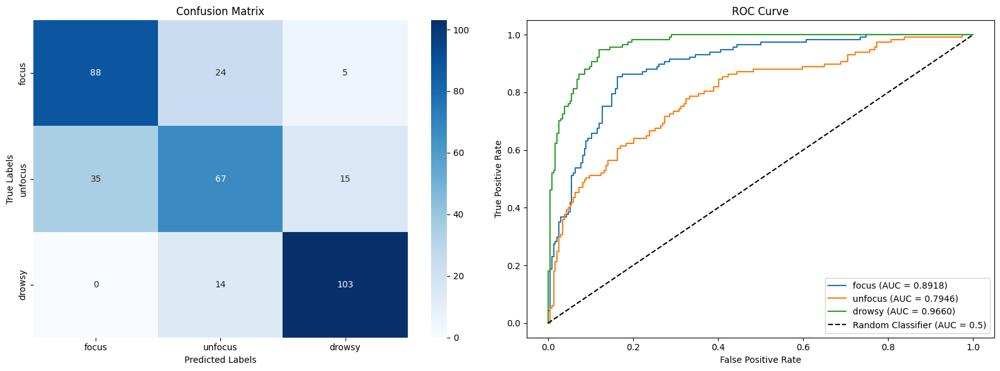

In [643]:
class_names =['focus', 'unfocus', 'drowsy']
dataset = EEGDataset(X_test_tensor, y_test_tensor)
dataloader = DataLoader(dataset, batch_size=64)
evaluate_model_on_test(model, dataloader, criterion, class_names)

Ta thấy ConvLSTM nhận biết rất tốt hai lớp là 'focus' và 'drowsy', đặc biệt là 'drowsy' khi không có mẫu nào thuộc 'drowsy' bị phân loại nhầm thành 'focus'

## Frequency Domain

### **Data Processing for frequency domain model**

In [594]:
day_train = 5 # lấy từ ngày 3 đến ngày 6 (do đã bỏ ngày 1 và 2 ra)

train_set, test_set = fre_processor.get_train_test_feature_set(restored_focus, restored_drowsy, restored_unfocus, fs = 128, window_size = 3840, overlap = 1920, day_train = day_train, day_test = None, random_state = 42)

# Chia dữ liệu thành feature và label
X_train = train_feature[:,0:-1]
X_test = test_feature[:,0:-1]
y_train = train_feature[:,-1]
y_test = test_feature[:,-1]

In [595]:
X_train.shape, y_train.shape

((1620, 392), (1620,))

### Random Forest

In [598]:
# Khởi tạo mô hình Random Forest
rf_clf = RandomForestClassifier(n_estimators=1000, random_state=42)

# Huấn luyện mô hình
rf_clf.fit(X_train, y_train)

RandomForestClassifier(n_estimators=1000, random_state=42)

Accuracy: 0.8066
Precision: 0.8048
Recall: 0.8066
F1 Score: 0.8053
Classification Report:
               precision    recall  f1-score   support

         0.0       0.84      0.89      0.86        81
         1.0       0.73      0.69      0.71        81
         2.0       0.85      0.84      0.84        81

    accuracy                           0.81       243
   macro avg       0.80      0.81      0.81       243
weighted avg       0.80      0.81      0.81       243



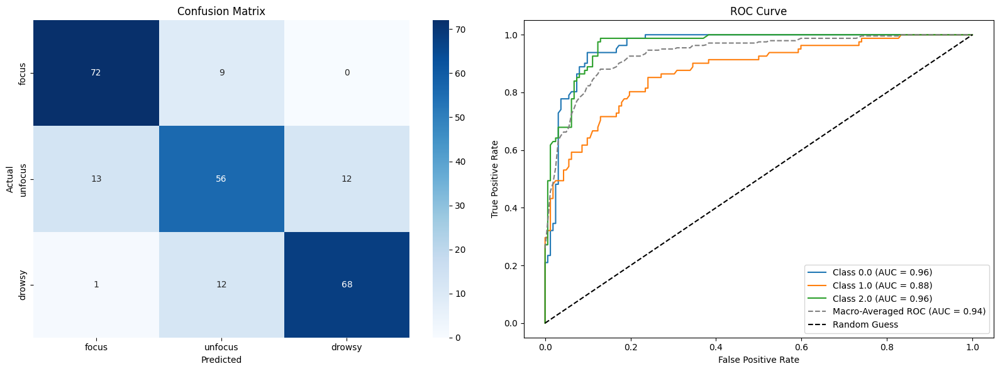

In [599]:
# Dự đoán
y_pred = rf_clf.predict(X_test)

# Đánh giá mô hình
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average="weighted")
recall = recall_score(y_test, y_pred, average="weighted")
f1 = f1_score(y_test, y_pred, average="weighted")

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print("Classification Report:\n", classification_report(y_test, y_pred))

# Ma trận nhầm lẫn (Confusion Matrix)
conf_matrix = confusion_matrix(y_test, y_pred)

classes = np.unique(np.concatenate([y_train, y_test]))
n_classes = len(classes)

# Chuyển nhãn đa lớp thành dạng nhị phân (One-vs-Rest)
Y_binarized = label_binarize(y_test, classes=classes)
Y_test_binarized = label_binarize(y_test, classes=classes)

# Dự đoán xác suất cho từng lớp
y_prob = rf_clf.predict_proba(X_test)

# Tính ROC và AUC cho từng lớp
fpr = {}
tpr = {}
roc_auc = {}

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(Y_test_binarized[:, i], y_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Tính Macro-Averaged AUC
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
mean_tpr = np.zeros_like(all_fpr)

for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

mean_tpr /= n_classes
macro_auc = auc(all_fpr, mean_tpr)

# trực quan hoá confusion matrix và ROC 
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Biểu đồ Confusion Matrix
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names, ax=axes[0])
axes[0].set_xlabel("Predicted")
axes[0].set_ylabel("Actual")
axes[0].set_title("Confusion Matrix")

# Biểu đồ ROC
for i in range(n_classes):
    axes[1].plot(fpr[i], tpr[i], label=f"Class {classes[i]} (AUC = {roc_auc[i]:.2f})")
axes[1].plot(all_fpr, mean_tpr, linestyle='--', color='gray', label=f"Macro-Averaged ROC (AUC = {macro_auc:.2f})")
axes[1].plot([0, 1], [0, 1], linestyle='--', color='black', label="Random Guess")
axes[1].set_xlabel("False Positive Rate")
axes[1].set_ylabel("True Positive Rate")
axes[1].set_title("ROC Curve")
axes[1].legend()

plt.tight_layout()
plt.show()

Ta thấy Random Forest nhận biết rất tốt hai lớp là 'focus' và 'drowsy'. Không có mẫu nào bị phân loại nhầm từ 'focus' thành 'drowsy' và chỉ có một mẫu duy nhất bị phân loại nhầm từ 'drowsy' thành 'focus'. Điều này cũng dễ hiểu vì hai trạng này nằm ở hai khoảng thời gian cách xa nhau trong thí nghiệm.

### SVM

In [549]:
# Chuẩn hoá dữ liệu trước khi đưa vào svm
scaler = StandardScaler()
scaler.fit(X_train)

X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Khởi tạo mô hình SVM với kernel RBF
svm_rbf = SVC(kernel='rbf', C=1.0, gamma='auto', probability=True, random_state=42)

# Huấn luyện mô hình
svm_rbf.fit(X_train_scaled, y_train)

SVC(gamma='auto', probability=True, random_state=42)

Accuracy: 0.6584
Precision: 0.6680
Recall: 0.6584
F1 Score: 0.6618
Classification Report:
               precision    recall  f1-score   support

         0.0       0.68      0.68      0.68        81
         1.0       0.53      0.59      0.56        81
         2.0       0.79      0.70      0.75        81

    accuracy                           0.66       243
   macro avg       0.67      0.66      0.66       243
weighted avg       0.67      0.66      0.66       243



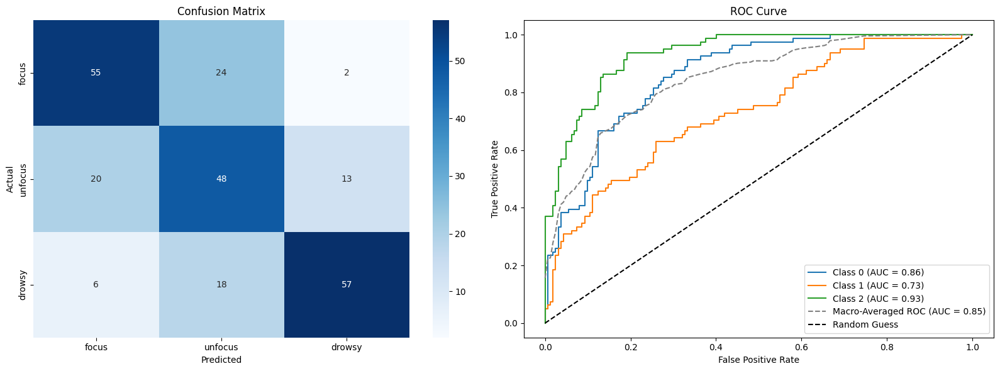

In [550]:
# Dự đoán trên tập kiểm tra
test_predictions = svm_rbf.predict(X_test_scaled)

# Đánh giá mô hình 
accuracy = accuracy_score(y_test, test_predictions)
precision = precision_score(y_test, test_predictions, average='macro')
recall = recall_score(y_test, test_predictions, average='macro')
f1 = f1_score(y_test, test_predictions, average='macro')

# In kết quả
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Báo cáo chi tiết
print("Classification Report:\n", classification_report(y_test, test_predictions))

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, test_predictions)
# Binarize nhãn cho ROC
n_classes = len(set(y_test))
y_test_binarized = label_binarize(y_test, classes=range(n_classes))
test_predictions_prob = svm_rbf.predict_proba(X_test_scaled)
fpr, tpr, roc_auc = {}, {}, {}

# Tính toán ROC và AUC cho mỗi lớp
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], test_predictions_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Tính Macro-Averaged AUC
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

mean_tpr /= n_classes
macro_auc = auc(all_fpr, mean_tpr)

# Tạo biểu đồ Confusion Matrix và ROC 
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Biểu đồ Confusion Matrix
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names, ax=axes[0])
axes[0].set_xlabel("Predicted")
axes[0].set_ylabel("Actual")
axes[0].set_title("Confusion Matrix")

# Biểu đồ ROC
for i in range(n_classes):
    axes[1].plot(fpr[i], tpr[i], label=f"Class {i} (AUC = {roc_auc[i]:.2f})")
axes[1].plot(all_fpr, mean_tpr, linestyle='--', color='gray', label=f"Macro-Averaged ROC (AUC = {macro_auc:.2f})")
axes[1].plot([0, 1], [0, 1], linestyle='--', color='black', label="Random Guess")
axes[1].set_xlabel("False Positive Rate")
axes[1].set_ylabel("True Positive Rate")
axes[1].set_title("ROC Curve")
axes[1].legend()

plt.tight_layout()
plt.show()

Ta thấy dữ liệu chạy trên Random Forest ra kết quả khá tốt, nhưng khi chạy trên SVM thì lại không được tốt. Điều đó cho thấy trong bộ features có những features ảnh hướng không tốt đến kết quả. Nên ta sẽ tiến hành lựa chọn feature bằng cách sử dụng Random Forest.

## Features Selection

- Sau khi trích xuất đặc trưng thông qua fourier transform, bộ dữ liệu mới xây dựng của chúng ta có 392 feature mới được tạo ra - một con số quá lớn và quá mất nhiều thời gian để phân tích và chọn kĩ từng feature để giữ lại.
- Thay vào đó, nhóm đề xuất xử dụng Random Forest để đánh giá feature từ đó chọn ra được một bộ feature giữ lại.
- Tập train giờ sẽ được chia ra thành tập train và tập valid, trong đó 3 ngày đầu sẽ dùng để train còn ngày 4 sẽ dùng làm tập valid để thử nghiệm.

In [609]:
# chia tập train và valid
day_train = 3
day_valid = 4
train_set, valid_set = processor.get_train_test_feature_set(
    restored_focus = restored_focus,
    restored_drowsy = restored_drowsy,
    restored_unfocus = restored_unfocus, 
    fs = fs, window_size = window_size, 
    overlap = overlap,
    day_train = day_train, 
    day_test = day_valid,
    random_state=40
)

X_train = train_set[:, 0:-1]
y_train = train_set[:, -1]
X_valid = valid_set[:, 0:-1]
y_valid = valid_set[:, -1]

print("Train size: ", X_train.shape[0])
print("Valid size: ", X_valid.shape[0])

Train size:  1800
Valid size:  600


In [610]:
# Chạy thử lại trên random forest
rf = RandomForestClassifier(n_estimators=1000, random_state=41)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_valid)
report = classification_report(y_valid, y_pred)
print(report)

              precision    recall  f1-score   support

         0.0       0.78      0.90      0.84       200
         1.0       0.66      0.52      0.58       200
         2.0       0.71      0.76      0.73       200

    accuracy                           0.72       600
   macro avg       0.72      0.72      0.72       600
weighted avg       0.72      0.72      0.72       600



- Khi dùng RF và test trên tập valid, kết quả trông có vẻ khá ổn.

In [611]:
# Sắp xếp lại feature importances
feature_importances = pd.DataFrame({
    'Feature': df.drop(columns=['state']).columns,
    'Importance': rf.feature_importances_
}).sort_values(by='Importance', ascending=False)

print("Feature Importances:")
print(feature_importances)

Feature Importances:
                  Feature  Importance
145  P7_delta_ratio_power    0.019162
173  O1_delta_ratio_power    0.014997
351   F8_alpha_mean_power    0.013023
353    F8_alpha_std_power    0.012151
350        F8_alpha_power    0.011938
..                    ...         ...
172   O1_delta_peak_power    0.000501
228   P8_delta_peak_power    0.000421
340   F8_delta_peak_power    0.000420
88   FC5_delta_peak_power    0.000413
389   AF4_beta_peak_power    0.000231

[392 rows x 2 columns]


- Bây giờ ta sẽ tìm số lượng feature để giữ lại.
- Ta sẽ dùng SVM để đánh giá kết quả của các feature giữ lại.
- Ta sẽ đặt ra một threshod sau đó giảm nó lại từ từ. Nếu sau một lượng hữu hạn lần lặp mà kết quả không tốt hơn thì ta sẽ dừng việc validation lại và lấy bộ feature tốt nhất ra.

In [614]:
def get_new_feature(feature_importances, threshold):
    """
    Lọc ra feature có độ importances lớn hơn threshold
    agr:
    feature_importances: dataframe gồm cột feature và importance được sắp xếp theo importace
    threshold (float): ngưỡng điểm để chọn
    
    """
    selected_features = feature_importances[feature_importances['Importance'] > threshold]['Feature']
    return selected_features
    
def get_new_X(df_data_set, selected_features):
    """
    Lấy ra data mới gồm những features đã chọn
    arg:
    df_data_set: dataframe của dataset ban đầu
    selected_features: danh sách tên các feature được chọn
    """
    return df_data_set[selected_features].values
    
def evaluate_new_features(selected_features,df_train_set, df_valid_set):
    """
    Đánh giá bộ features mới bằng f1 score và model SVM
    arg:
    selected_features: danh sách tên các feature được chọn
    df_train_set: dataframe của tập train
    df_valid_set: dataframe của tâp valid
    """
    # chuẩn bị data
    X_train = get_new_X(df_train_set, selected_features)
    y_train = df_train_set['state'].values
    X_valid = get_new_X(df_valid_set, selected_features)
    y_valid = df_valid_set['state'].values

    # Scale lại dữ diệu
    scaler = StandardScaler()
    scaler.fit(X_train)
    X_train = scaler.transform(X_train)
    X_valid = scaler.transform(X_valid)

    # Khởi tạo model, train và evaluate
    svm = SVC(kernel='rbf', random_state=42)
    svm.fit(X_train, y_train)
    y_pred = svm.predict(X_valid)
    f1 = f1_score(y_valid, y_pred,average= "macro")
    return f1

class EarlyStopping:
    def __init__(self, patience=5, error= 0.03):
        self.patience = patience
        self.best_set_features = None
        self.no_improve_count = 0
        self.best_score = -1
        self.error = error
    
    def should_stop(self,current_set_features, current_score):

        if current_score < self.best_score - self.error:
            self.no_improve_count += 1
            print("No accept")
        elif current_score > self.best_score:
            self.no_improve_count = 0
            self.best_score = current_score
            self.best_set_features = current_set_features
            print("Improve")
        else:
            print("Accept")

        if self.no_improve_count >= self.patience:
            return True 
            
        return False

    def get_best_result(self):
        return self.best_set_features, self.best_score

### Thực hiện quá trình chọn features

In [615]:
df_train_set = pd.DataFrame(train_set, columns=FULL_FEATURES)
df_valid_set = pd.DataFrame(valid_set, columns=FULL_FEATURES)
early_stopping = EarlyStopping(patience = 5)
threshold = 0.01
move = 0.0005

while threshold > 0.00049:
    selected_features = get_new_feature(feature_importances, threshold)
    score = evaluate_new_features(selected_features,df_train_set, df_valid_set)
    print(f"Threshold: {threshold}")
    print(f"Size of features: {len(selected_features)}")
    print(f"f1_score : {score:.3f}")

    if early_stopping.should_stop(selected_features, score):
        print("Early stop")
        break
        
    threshold -= move
        
    print("------------------------------------------------------")

best_features, score = early_stopping.get_best_result()
print(f"f1_score: {score}")

feature_importances[feature_importances["Feature"].isin(best_features) ]

Threshold: 0.01
Size of features: 7
f1_score : 0.564
Improve
------------------------------------------------------
Threshold: 0.0095
Size of features: 8
f1_score : 0.566
Improve
------------------------------------------------------
Threshold: 0.009
Size of features: 10
f1_score : 0.576
Improve
------------------------------------------------------
Threshold: 0.008499999999999999
Size of features: 11
f1_score : 0.569
Accept
------------------------------------------------------
Threshold: 0.007999999999999998
Size of features: 12
f1_score : 0.574
Accept
------------------------------------------------------
Threshold: 0.007499999999999998
Size of features: 13
f1_score : 0.584
Improve
------------------------------------------------------
Threshold: 0.0069999999999999975
Size of features: 16
f1_score : 0.590
Improve
------------------------------------------------------
Threshold: 0.006499999999999997
Size of features: 19
f1_score : 0.594
Improve
---------------------------------------

,Feature,Importance
145,P7_delta_ratio_power,0.019162
173,O1_delta_ratio_power,0.014997
351,F8_alpha_mean_power,0.013023
353,F8_alpha_std_power,0.012151
350,F8_alpha_power,0.011938
...,...,...
308,F4_delta_power,0.002082
203,O2_theta_power,0.002076
355,F8_alpha_ratio_power,0.002072
259,T8_theta_power,0.002058


In [637]:
# chia tập train và valid
day_train = 4
day_test = None
train_set, test_set = processor.get_train_test_feature_set(
    restored_focus = restored_focus,
    restored_drowsy = restored_drowsy,
    restored_unfocus = restored_unfocus, 
    fs = fs, window_size = window_size, 
    overlap = overlap,
    day_train = day_train, 
    day_test = day_test,
    random_state=40
)
df_train_set = pd.DataFrame(train_set, columns=FULL_FEATURES)
df_test_set = pd.DataFrame(test_set, columns=FULL_FEATURES)

train_set = get_new_X(df_train_set, best_features)
test_set = get_new_X(df_test_set, best_features)

### Đánh giá lại mô hình SVM trên tập features mới 

Accuracy: 0.7306
Precision: 0.7395
Recall: 0.7306
F1 Score: 0.7316
Classification Report:
               precision    recall  f1-score   support

         0.0       0.70      0.82      0.75       120
         1.0       0.64      0.62      0.63       120
         2.0       0.88      0.75      0.81       120

    accuracy                           0.73       360
   macro avg       0.74      0.73      0.73       360
weighted avg       0.74      0.73      0.73       360



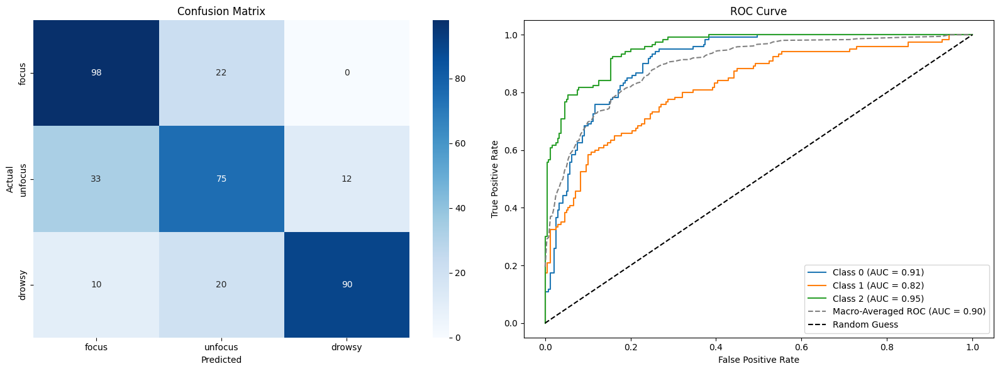

In [639]:
# Lấy ra tập train và test
X_train = get_new_X(df_train_set, best_features)
y_train = df_train_set['state'].values
X_test = get_new_X(df_test_set, best_features)
y_test = df_test_set['state'].values

# Chuẩn hoá lại dữ liệu
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Huấn luyện mô hình
svm_rbf.fit(X_train_scaled, y_train)

# Dự đoán trên tập kiểm tra
test_predictions = svm_rbf.predict(X_test_scaled)

# Đánh giá mô hình 
accuracy = accuracy_score(y_test, test_predictions)
precision = precision_score(y_test, test_predictions, average='macro')
recall = recall_score(y_test, test_predictions, average='macro')
f1 = f1_score(y_test, test_predictions, average='macro')

# In kết quả
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Báo cáo chi tiết
print("Classification Report:\n", classification_report(y_test, test_predictions))

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, test_predictions)
# Binarize nhãn cho ROC
n_classes = len(set(y_test))
y_test_binarized = label_binarize(y_test, classes=range(n_classes))
test_predictions_prob = svm_rbf.predict_proba(X_test_scaled)
fpr, tpr, roc_auc = {}, {}, {}

# Tính toán ROC và AUC cho mỗi lớp
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], test_predictions_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Tính Macro-Averaged AUC
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

mean_tpr /= n_classes
macro_auc = auc(all_fpr, mean_tpr)

# Tạo biểu đồ Confusion Matrix và ROC 
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Biểu đồ Confusion Matrix
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names, ax=axes[0])
axes[0].set_xlabel("Predicted")
axes[0].set_ylabel("Actual")
axes[0].set_title("Confusion Matrix")

# Biểu đồ ROC
for i in range(n_classes):
    axes[1].plot(fpr[i], tpr[i], label=f"Class {i} (AUC = {roc_auc[i]:.2f})")
axes[1].plot(all_fpr, mean_tpr, linestyle='--', color='gray', label=f"Macro-Averaged ROC (AUC = {macro_auc:.2f})")
axes[1].plot([0, 1], [0, 1], linestyle='--', color='black', label="Random Guess")
axes[1].set_xlabel("False Positive Rate")
axes[1].set_ylabel("True Positive Rate")
axes[1].set_title("ROC Curve")
axes[1].legend()

plt.tight_layout()
plt.show()

Ta thấy điểm số của mô hình SVM đã cải thiện rất rõ khi fit lại trên bộ feature đã được chọn ra.

# KẾT LUẬN

**Qua quá trình xử lý dữ liệu và điểm số của các mô hình ta thấy:**
* CNN vượt trội hơn so với các mô hình truyền thống khi tự học được các đặc trưng của dữ liệu thô trên miền thời gian mà không cần trải qua các quá trình tiền xử lý dữ liệu phức tạp
* Random Forest (RF): Random Forest là một mô hình mạnh mẽ dựa trên phương
pháp ensemble, hoạt động tốt với dữ liệu đã được tiền xử lý, chẳng hạn như đặc trưng
trên miền tần số. RF có khả năng lựa chọn các đặc trưng quan trọng thông qua chỉ số
feature importance, giúp giảm thiểu độ phức tạp của dữ liệu và tăng khả năng tổng quát
hóa. Trong thử nghiệm, RF đạt hiệu suất cao nhất trong số ba mô hình (SVM, CNN,
RF) nhờ:
  >Khả năng xử lý dữ liệu phức tạp trên miền tần số mà không cần điều chỉnh nhiều
tham số.
  
  >Tính linh hoạt trong việc thích ứng với dữ liệu không đồng nhất và phi tuyến.
  
  >Khả năng tránh hiện tượng overfitting nhờ việc sử dụng tập hợp nhiều cây quyết

* Support Vector Machine (SVM): SVM là một mô hình truyền thống được sử dụng
phổ biến trong các bài toán phân loại và hồi quy. Trên miền tần số, SVM có thể đạt được
hiệu suất tốt với tập dữ liệu nhỏ hoặc trung bình. Tuy nhiên, SVM bị giới hạn bởi:
 >kết quả cải thiện khi thực hiện chọn được bộ feature tối ưu

  >Cần tiền xử lý dữ liệu kỹ lưỡng (chuẩn hóa, chọn lọc đặc trưng) để đạt hiệu quả tối ưu